In [3]:
%config IPCompleter.use_jedi = False
import os
import pandas as pd
import numpy as np
import math
from collections import Counter
from datetime import datetime
import holidays
import graphviz
import warnings
import geopandas as gpd
from shapely.geometry import Polygon, Point, MultiPolygon
import contextlib

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import ipywidgets as widgets
import plotly.io as pio
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import shap

import xgboost as xgb
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose

import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, precision_score, recall_score, accuracy_score, classification_report, brier_score_loss,f1_score, classification_report, confusion_matrix, RocCurveDisplay, auc, roc_curve
from sklearn.preprocessing import MinMaxScaler, StandardScaler, Normalizer, RobustScaler,OrdinalEncoder, LabelEncoder, OneHotEncoder, KBinsDiscretizer, PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit, train_test_split, GridSearchCV,RandomizedSearchCV, StratifiedKFold, validation_curve, learning_curve, cross_val_score, RepeatedStratifiedKFold
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from sklearn.inspection import permutation_importance 
from sklearn.feature_extraction import DictVectorizer
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.neighbors import KernelDensity
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.calibration import calibration_curve, CalibratedClassifierCV


%matplotlib inline
sns.set_style('dark')
# shap.initjs()

ModuleNotFoundError: No module named 'holidays'

In [2]:
df = pd.read_csv('model_data.csv',index_col=0, parse_dates=True)
print(df.columns)
display(df.head(10))

Index(['dtg_melding', 'plaatscode', 'plaatsnaam', 'wijkcode', 'naam_locatie_1',
       'long', 'lat'],
      dtype='object')


,dtg_melding,plaatscode,plaatsnaam,wijkcode,naam_locatie_1,long,lat
interval,,,,,,,
2018-11-06 11:57:24.999264,2018-11-06 11:57:24.999264,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:57:29.999232,2018-11-06 11:57:29.999232,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:57:45.000000,2018-11-06 11:57:45.000000,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:57:45.000000,2018-11-06 11:57:45.000000,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2019-02-27 12:15:40.000032,2019-02-27 12:15:40.000032,GM0531,Hendrik-Ido-Ambacht,WK053101,Onderdijk,4.648306,51.851395
2019-04-22 13:47:45.999744,2019-04-22 13:47:45.999744,GM0531,Hendrik-Ido-Ambacht,WK053101,Emmasingel,4.645388,51.851421


# Analytics

In [3]:
df_datum = df.copy()
df_datum= df_datum.resample('6H').agg({'dtg_melding': 'count'})
display(df_datum.head())

,dtg_melding
interval,
2018-05-15 00:00:00,18
2018-05-15 06:00:00,20
2018-05-15 12:00:00,36
2018-05-15 18:00:00,31
2018-05-16 00:00:00,11


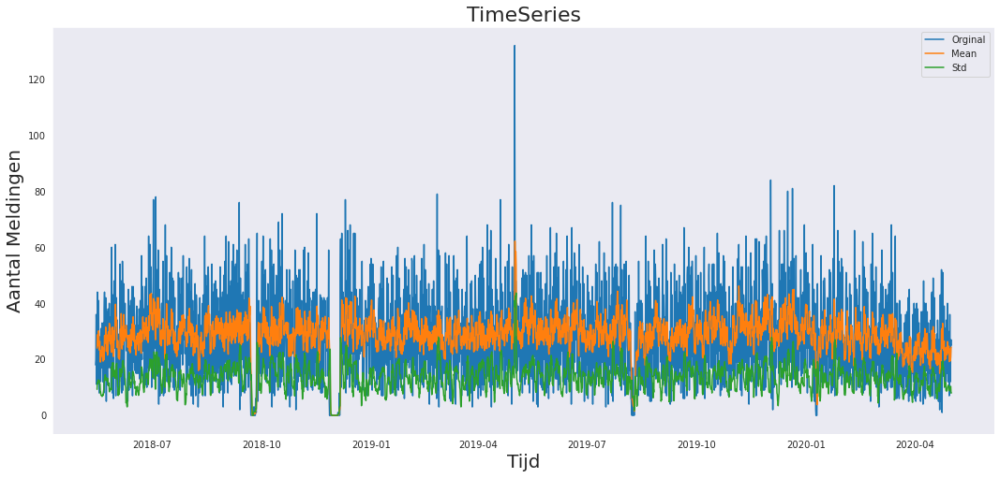

In [4]:
rmean = df_datum.rolling(6).mean()
rstd = df_datum.rolling(6).std()

plt.figure(figsize=(18,8))
plt.title('TimeSeries', fontsize=22)
plt.plot(df_datum.index, df_datum.values, label='Orginal')
plt.plot(rmean.index, rmean.values, label='Mean')
plt.plot(rstd.index, rstd.values, label='Std')
plt.xlabel('Tijd', fontsize=20)
plt.ylabel('Aantal Meldingen', fontsize=20)
plt.legend()


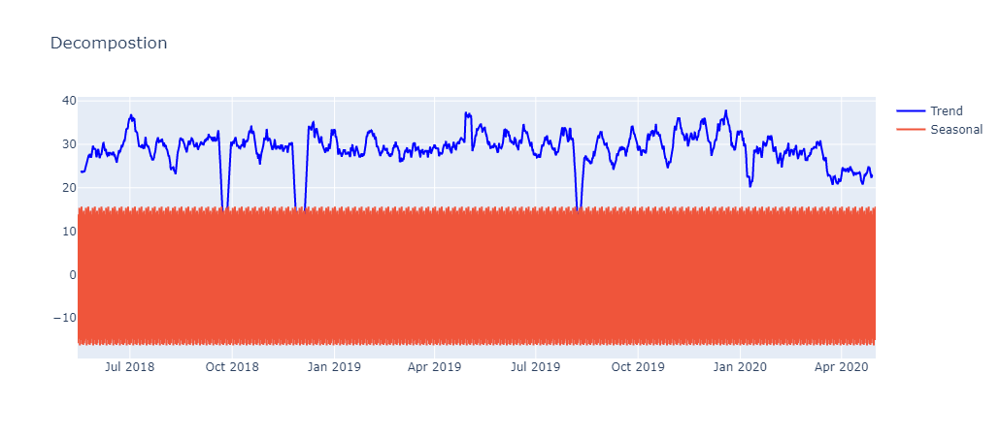

In [5]:
decompostion = seasonal_decompose(df_datum.dtg_melding)
trace1 = go.Scatter(x = df_datum.index, y=decompostion.trend, name = 'Trend', 
                    line=dict(color='blue', width=2))
trace2 = go.Scatter(x = df_datum.index, y = decompostion.seasonal,
                   name = 'Seasonal', mode='lines')
trace3 = go.Scatter(x = df_datum.index, y = decompostion.resid,
                   name = 'Residual', mode='lines')
data = [trace1,trace2]
fig = go.Figure(
    data=data,
    layout={'title':'Decompostion'})
fig.show()

## Helper functions

In [6]:
def werktijd(uur):
    if 9 <= uur < 17:
        return True
    else:
        return False
    
def melding_label(value):
    if value == 0:
        return 0
    if 1 <= value <= 2:
        return 1
    if value >= 3:
        return 2

In [7]:
def get_feature_names(column_transformer):
    """Get feature names from all transformers.
    Returns
    -------
    feature_names : list of strings
        Names of the features produced by transform.
    """
    # Remove the internal helper function
    #check_is_fitted(column_transformer)
    
    # Turn loopkup into function for better handling with pipeline later
    def get_names(trans):
        # >> Original get_feature_names() method
        if trans == 'drop' or (
                hasattr(column, '__len__') and not len(column)):
            return []
        if trans == 'passthrough':
            if hasattr(column_transformer, '_df_columns'):
                if ((not isinstance(column, slice))
                        and all(isinstance(col, str) for col in column)):
                    return column
                else:
                    return column_transformer._df_columns[column]
            else:
                indices = np.arange(column_transformer._n_features)
                return ['x%d' % i for i in indices[column]]
        if not hasattr(trans, 'get_feature_names'):
        # >>> Change: Return input column names if no method avaiable
            # Turn error into a warning
            warnings.warn("Transformer %s (type %s) does not "
                                 "provide get_feature_names. "
                                 "Will return input column names if available"
                                 % (str(name), type(trans).__name__))
            # For transformers without a get_features_names method, use the input
            # names to the column transformer
            if column is None:
                return []
            else:
                return [name + "__" + f for f in column]

        return [name + "__" + f for f in trans.get_feature_names()]
    
    ### Start of processing
    feature_names = []
    
    # Allow transformers to be pipelines. Pipeline steps are named differently, so preprocessing is needed
    if type(column_transformer) == sklearn.pipeline.Pipeline:
        l_transformers = [(name, trans, None, None) for step, name, trans in column_transformer._iter()]
    else:
        # For column transformers, follow the original method
        l_transformers = list(column_transformer._iter(fitted=True))
    
    
    for name, trans, column, _ in l_transformers: 
        if type(trans) == sklearn.pipeline.Pipeline:
            # Recursive call on pipeline
            _names = get_feature_names(trans)
            # if pipeline has no transformer that returns names
            if len(_names)==0:
                _names = [name + "__" + f for f in column]
            feature_names.extend(_names)
        else:
            feature_names.extend(get_names(trans))
    
    return feature_names

In [8]:
def plot_calibration_curve(est, name, fig_index):
    """Plot calibration curve for est w/o and with calibration. """
    # Calibrated with isotonic calibration
    isotonic = CalibratedClassifierCV(est, cv=2, method='isotonic')

    # Calibrated with sigmoid calibration
    sigmoid = CalibratedClassifierCV(est, cv=2, method='sigmoid')

    # Logistic regression with no calibration as baseline
    lr = LogisticRegression(C=1.)

    fig = plt.figure(fig_index, figsize=(10, 10))
    ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
    ax2 = plt.subplot2grid((3, 1), (2, 0))

    ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
    for clf, name in [(lr, 'Logistic'),
                      (est, name),
                      (isotonic, name + ' + Isotonic'),
                      (sigmoid, name + ' + Sigmoid')]:
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        if hasattr(clf, "predict_proba"):
            prob_pos = clf.predict_proba(X_test)[:, 1]
        else:  # use decision function
            prob_pos = clf.decision_function(X_test)
            prob_pos = \
                (prob_pos - prob_pos.min()) / (prob_pos.max() - prob_pos.min())

        clf_score = brier_score_loss(y_test, prob_pos, pos_label=y.max())
        print("%s:" % name)
        print("\tBrier: %1.3f" % (clf_score))
        print("\tPrecision: %1.3f" % precision_score(y_test, y_pred))
        print("\tRecall: %1.3f" % recall_score(y_test, y_pred))
        print("\tF1: %1.3f\n" % f1_score(y_test, y_pred))

        fraction_of_positives, mean_predicted_value = \
            calibration_curve(y_test, prob_pos, n_bins=10)

        ax1.plot(mean_predicted_value, fraction_of_positives, "s-",
                 label="%s (%1.3f)" % (name, clf_score))

        ax2.hist(prob_pos, range=(0, 1), bins=10, label=name,
                 histtype="step", lw=2)

    ax1.set_ylabel("Fraction of positives")
    ax1.set_ylim([-0.05, 1.05])
    ax1.legend(loc="lower right")
    ax1.set_title('Calibration plots  (reliability curve)')

    ax2.set_xlabel("Mean predicted value")
    ax2.set_ylabel("Count")
    ax2.legend(loc="upper center", ncol=2)

    plt.tight_layout()

## XGBoost - 30 min
30 mins because otherwise our model will have a  great bias towards 1(melding) compared to 0(geen-melding)

In [9]:
df.head(15)

,dtg_melding,plaatscode,plaatsnaam,wijkcode,naam_locatie_1,long,lat
interval,,,,,,,
2018-11-06 11:57:24.999264,2018-11-06 11:57:24.999264,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:57:29.999232,2018-11-06 11:57:29.999232,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:57:45.000000,2018-11-06 11:57:45.000000,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2018-11-06 11:57:45.000000,2018-11-06 11:57:45.000000,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.651790,51.857610
2019-02-27 12:15:40.000032,2019-02-27 12:15:40.000032,GM0531,Hendrik-Ido-Ambacht,WK053101,Onderdijk,4.648306,51.851395
2019-04-22 13:47:45.999744,2019-04-22 13:47:45.999744,GM0531,Hendrik-Ido-Ambacht,WK053101,Emmasingel,4.645388,51.851421


#### This resamples the DTG-melding to time intervals of 30min

In [10]:
df_mod = df.copy()
df_mod= df.resample('30T').agg({'dtg_melding': 'count'})

df_mod['dtg_melding'] = df_mod['dtg_melding'].astype(int)

print(df_mod.shape)
# print(df_mod.isnull().sum())
display(df_mod.head(10))

(34463, 1)


,dtg_melding
interval,
2018-05-15 00:30:00,8
2018-05-15 01:00:00,0
2018-05-15 01:30:00,1
2018-05-15 02:00:00,1
2018-05-15 02:30:00,0
2018-05-15 03:00:00,1
2018-05-15 03:30:00,1
2018-05-15 04:00:00,0
2018-05-15 04:30:00,2


### Feature Engineering
Here we make new features of our timeindex, in the hope that it will help our classifier

In [11]:
# print(type(df_mod.index))
# df_mod['jaar'] = pd.DatetimeIndex(df_mod.index).year
df_mod['maand'] = pd.DatetimeIndex(df_mod.index).month
df_mod['kwartaal'] = pd.DatetimeIndex(df_mod.index).quarter
df_mod['weekvanjaar'] = pd.DatetimeIndex(df_mod.index).isocalendar().week
df_mod['weekdag'] = pd.DatetimeIndex(df_mod.index).weekday
df_mod['dagvanjaar'] = pd.DatetimeIndex(df_mod.index).dayofyear
df_mod['dag'] = pd.DatetimeIndex(df_mod.index).day
df_mod['dagdeel'] = pd.DatetimeIndex(df_mod.index).hour
df_mod['uur'] = pd.DatetimeIndex(df_mod.index).hour
df_mod['werktijd'] = pd.DatetimeIndex(df_mod.index).hour
df_mod['minuten'] = pd.DatetimeIndex(df_mod.index).minute
df_mod['werkdag'] = pd.DatetimeIndex(df_mod.index).weekday < 5
# df_mod['begin_van_maand'] = pd.DatetimeIndex(df_mod.index).is_month_start
# df_mod['eind_van_maand'] = pd.DatetimeIndex(df_mod.index).is_month_end
df_mod['lopend_gemiddelde_2u'] = df_mod['dtg_melding'].rolling(window=4, min_periods=1).mean()
df_mod['lopend_gemiddelde_6u'] = df_mod['dtg_melding'].rolling(window=12, min_periods=1).mean()
df_mod['lopend_gemiddelde_dag'] = df_mod['dtg_melding'].rolling(window=48, min_periods=1).mean()
df_mod['uitbereidend_gemiddelde'] = df_mod['dtg_melding'].expanding(min_periods=1).mean()
df_mod['weekend'] = df_mod['weekdag'] > 4
# df_mod['weekGemiddelde'] = df_mod['weekvanjaar'].mean()


# Binning = Categorizing data based on threshold values
bins = [-np.inf, 6, 12, 18, 24]
dagdelen = ['nacht','ochtend', 'middag', 'avond']
df_mod['dagdeel'] = pd.cut(df_mod['dagdeel'], bins, labels=dagdelen)

bins = [0, 91, 183, 275, 366]
seizoenen = labels=['winter', 'lente', 'zomer', 'herfst']
df_mod['seizoen'] = pd.cut((df_mod.dag + 11) % 366, bins=bins, labels=seizoenen)

# Feestdagen
feestdagenData = pd.to_datetime(list(holidays.NL(years=[2018, 2019, 2020]).keys()))
feestdagenNamen = list(holidays.NL(years=[2018, 2019, 2020]).values())
df_mod['feestdag'] = df_mod.index.isin(feestdagenData.values)

# Binaray classifcation if timeindex is at workinkhours
df_mod['werktijd'] = df_mod['werktijd'].apply(lambda x: werktijd(x))

print(df_mod.shape)
print(df_mod.columns)
df_mod.head(10)

(34463, 19)
Index(['dtg_melding', 'maand', 'kwartaal', 'weekvanjaar', 'weekdag',
       'dagvanjaar', 'dag', 'dagdeel', 'uur', 'werktijd', 'minuten', 'werkdag',
       'lopend_gemiddelde_2u', 'lopend_gemiddelde_6u', 'lopend_gemiddelde_dag',
       'uitbereidend_gemiddelde', 'weekend', 'seizoen', 'feestdag'],
      dtype='object')


,dtg_melding,maand,kwartaal,weekvanjaar,weekdag,dagvanjaar,dag,dagdeel,uur,werktijd,minuten,werkdag,lopend_gemiddelde_2u,lopend_gemiddelde_6u,lopend_gemiddelde_dag,uitbereidend_gemiddelde,weekend,seizoen,feestdag
interval,,,,,,,,,,,,,,,,,,,
2018-05-15 00:30:00,8,5,2,20,1,135,15,nacht,0,False,30,True,8.00,8.000000,8.000000,8.000000,False,winter,False
2018-05-15 01:00:00,0,5,2,20,1,135,15,nacht,1,False,0,True,4.00,4.000000,4.000000,4.000000,False,winter,False
2018-05-15 01:30:00,1,5,2,20,1,135,15,nacht,1,False,30,True,3.00,3.000000,3.000000,3.000000,False,winter,False
2018-05-15 02:00:00,1,5,2,20,1,135,15,nacht,2,False,0,True,2.50,2.500000,2.500000,2.500000,False,winter,False
2018-05-15 02:30:00,0,5,2,20,1,135,15,nacht,2,False,30,True,0.50,2.000000,2.000000,2.000000,False,winter,False
2018-05-15 03:00:00,1,5,2,20,1,135,15,nacht,3,False,0,True,0.75,1.833333,1.833333,1.833333,False,winter,False
2018-05-15 03:30:00,1,5,2,20,1,135,15,nacht,3,False,30,True,0.75,1.714286,1.714286,1.714286,False,winter,False
2018-05-15 04:00:00,0,5,2,20,1,135,15,nacht,4,False,0,True,0.50,1.500000,1.500000,1.500000,False,winter,False
2018-05-15 04:30:00,2,5,2,20,1,135,15,nacht,4,False,30,True,1.00,1.555556,1.555556,1.555556,False,winter,False


### More feature engineering!

In [12]:
Avguur =df_mod.groupby(['uur']).agg(Avguur=('dtg_melding', 'mean'))
Avgdagtijd = df_mod.groupby(['weekvanjaar','weekdag', 'uur']).agg(Avgdagtijd=('dtg_melding', 'mean'))
Avgwerktijd = df_mod.groupby(['weekvanjaar','weekdag', 'werktijd']).agg(Avgwerktijd=('dtg_melding', 'mean'))
Avgdagvanjaar = df_mod.groupby(['dagvanjaar']).agg(Avgdagvanjaar=('dtg_melding', 'mean'))
AvgweekvJweekDdeelD = df_mod.groupby(['weekvanjaar','weekdag', 'dagdeel']).agg(AvgweekvJweekDdeelD=('dtg_melding', 'mean'))

df_mod = df_mod.merge(Avguur, on=['uur'])
df_mod = df_mod.merge(Avgdagtijd, on=['weekvanjaar','weekdag', 'uur'])
df_mod = df_mod.merge(Avgwerktijd, on=['weekvanjaar', 'weekdag', 'werktijd'])
df_mod = df_mod.merge(Avgdagvanjaar, on='dagvanjaar')
df_mod = df_mod.merge(AvgweekvJweekDdeelD, on=['weekvanjaar', 'weekdag', 'dagdeel'])
df_mod.head(10)

,dtg_melding,maand,kwartaal,weekvanjaar,weekdag,dagvanjaar,dag,dagdeel,uur,werktijd,...,lopend_gemiddelde_dag,uitbereidend_gemiddelde,weekend,seizoen,feestdag,Avguur,Avgdagtijd,Avgwerktijd,Avgdagvanjaar,AvgweekvJweekDdeelD
0,8,5,2,20,1,135,15,nacht,0,False,...,8.000000,8.000000,False,winter,False,1.563066,3.00,2.174603,2.673684,1.222222
1,0,5,2,20,1,135,15,nacht,1,False,...,4.000000,4.000000,False,winter,False,1.222841,0.50,2.174603,2.673684,1.222222
2,1,5,2,20,1,135,15,nacht,1,False,...,3.000000,3.000000,False,winter,False,1.222841,0.50,2.174603,2.673684,1.222222
3,1,5,2,20,1,135,15,nacht,2,False,...,2.500000,2.500000,False,winter,False,1.042479,0.25,2.174603,2.673684,1.222222
4,0,5,2,20,1,135,15,nacht,2,False,...,2.000000,2.000000,False,winter,False,1.042479,0.25,2.174603,2.673684,1.222222
5,1,5,2,20,1,135,15,nacht,3,False,...,1.833333,1.833333,False,winter,False,0.977019,0.75,2.174603,2.673684,1.222222
6,1,5,2,20,1,135,15,nacht,3,False,...,1.714286,1.714286,False,winter,False,0.977019,0.75,2.174603,2.673684,1.222222
7,0,5,2,20,1,135,15,nacht,4,False,...,1.500000,1.500000,False,winter,False,0.866295,1.00,2.174603,2.673684,1.222222
8,2,5,2,20,1,135,15,nacht,4,False,...,1.555556,1.555556,False,winter,False,0.866295,1.00,2.174603,2.673684,1.222222
9,4,5,2,20,1,135,15,nacht,5,False,...,1.800000,1.800000,False,winter,False,0.848886,1.75,2.174603,2.673684,1.222222


### Distrobution of #dtg-meldingen

<AxesSubplot:xlabel='dtg_melding', ylabel='count'>

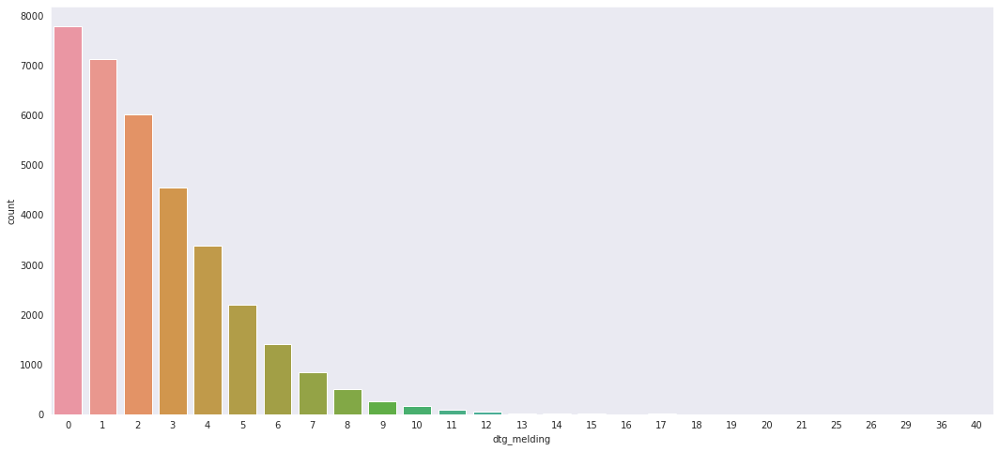

In [13]:
# distro = df_mod.dtg_melding.value_counts()
# print(distro)
plt.figure(figsize=(18,8))
sns.countplot(x='dtg_melding', data=df_mod)

In [14]:
# df_mod.hist(bins=30, figsize=(20,20), color='g')

In [15]:
# sns.pairplot(df_mod)

### Here you can see the correlation of features!

<AxesSubplot:>

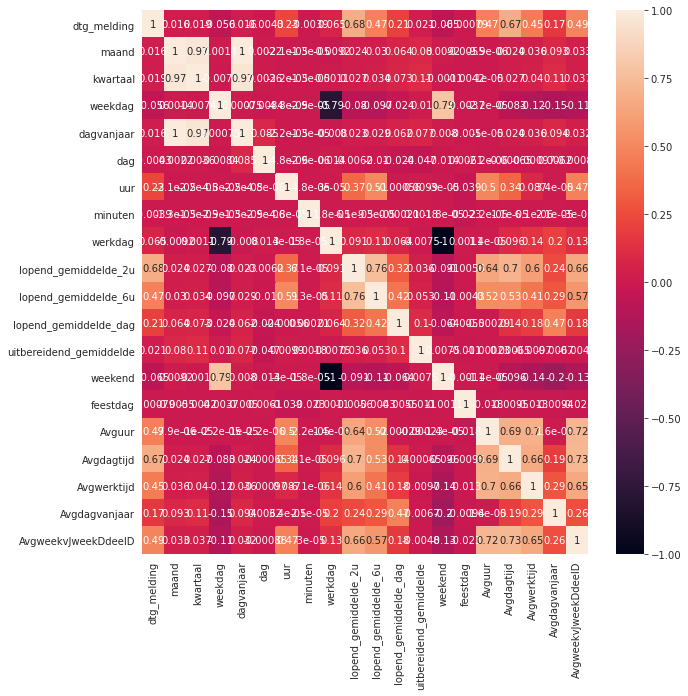

In [16]:
plt.figure(figsize=(10,10))
corr_matrix = df_mod.corr()
sns.heatmap(corr_matrix, annot=True)

#### Transform the dtg_melding column into binary
- 0 = **GEEN** melding
- 1 = **WEL** melding

In [17]:
df_mod['dtg_melding'] = df_mod['dtg_melding'] > 1
df_mod['dtg_melding'] = df_mod['dtg_melding'].astype(int)

In [18]:
df_mod.head(10)

,dtg_melding,maand,kwartaal,weekvanjaar,weekdag,dagvanjaar,dag,dagdeel,uur,werktijd,...,lopend_gemiddelde_dag,uitbereidend_gemiddelde,weekend,seizoen,feestdag,Avguur,Avgdagtijd,Avgwerktijd,Avgdagvanjaar,AvgweekvJweekDdeelD
0,1,5,2,20,1,135,15,nacht,0,False,...,8.000000,8.000000,False,winter,False,1.563066,3.00,2.174603,2.673684,1.222222
1,0,5,2,20,1,135,15,nacht,1,False,...,4.000000,4.000000,False,winter,False,1.222841,0.50,2.174603,2.673684,1.222222
2,0,5,2,20,1,135,15,nacht,1,False,...,3.000000,3.000000,False,winter,False,1.222841,0.50,2.174603,2.673684,1.222222
3,0,5,2,20,1,135,15,nacht,2,False,...,2.500000,2.500000,False,winter,False,1.042479,0.25,2.174603,2.673684,1.222222
4,0,5,2,20,1,135,15,nacht,2,False,...,2.000000,2.000000,False,winter,False,1.042479,0.25,2.174603,2.673684,1.222222
5,0,5,2,20,1,135,15,nacht,3,False,...,1.833333,1.833333,False,winter,False,0.977019,0.75,2.174603,2.673684,1.222222
6,0,5,2,20,1,135,15,nacht,3,False,...,1.714286,1.714286,False,winter,False,0.977019,0.75,2.174603,2.673684,1.222222
7,0,5,2,20,1,135,15,nacht,4,False,...,1.500000,1.500000,False,winter,False,0.866295,1.00,2.174603,2.673684,1.222222
8,1,5,2,20,1,135,15,nacht,4,False,...,1.555556,1.555556,False,winter,False,0.866295,1.00,2.174603,2.673684,1.222222
9,1,5,2,20,1,135,15,nacht,5,False,...,1.800000,1.800000,False,winter,False,0.848886,1.75,2.174603,2.673684,1.222222


<AxesSubplot:>

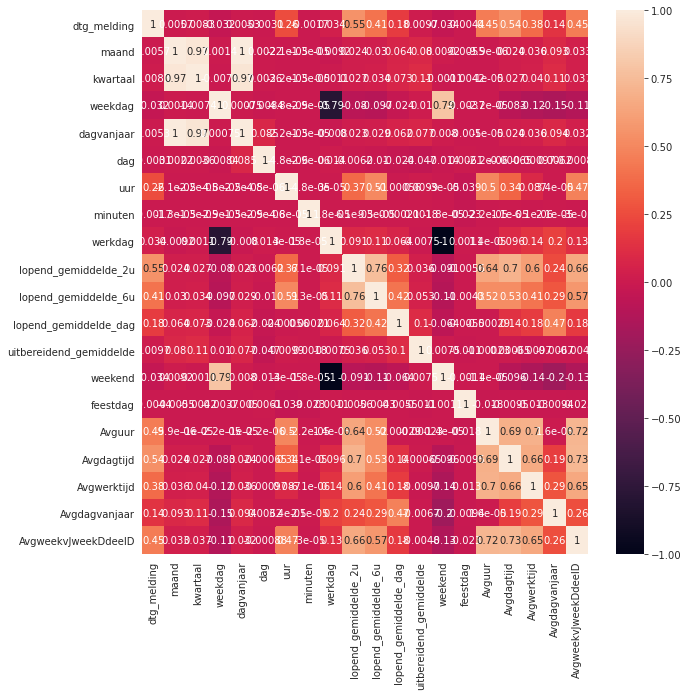

In [19]:
plt.figure(figsize=(10,10))
corr_matrix = df_mod.corr()
sns.heatmap(corr_matrix, annot=True)

## Ratio 0's and 1's!

*Since the distribution is quite fair we wont have a very strong bias!* (hopefully)

0.5671589820967414
(34463, 24)
Ratio 0: 0.4328410179032586
Ratio 1: 0.5671589820967414


<AxesSubplot:title={'center':'Ratios'}, xlabel='dtg_melding', ylabel='count'>

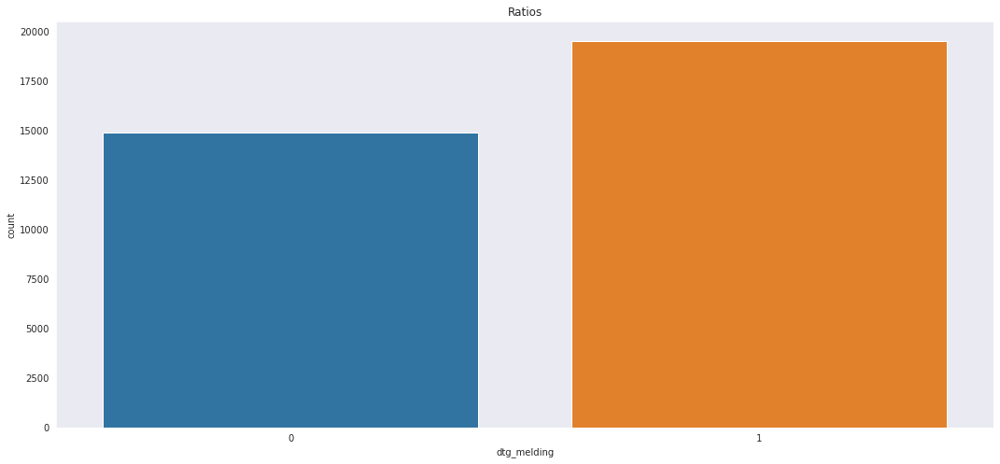

In [20]:
print(df_mod.dtg_melding.mean())
ratio_0 = df_mod.dtg_melding[df_mod.dtg_melding == 0].count()/df_mod.shape[0]
ratio_1 = df_mod.dtg_melding[df_mod.dtg_melding == 1].count()/df_mod.shape[0]
print(df_mod.shape)
print('Ratio 0: {}'.format(ratio_0))
print('Ratio 1: {}'.format(ratio_1))

plt.figure(figsize=(18,8))
plt.title('Ratios')
sns.countplot(x='dtg_melding', data=df_mod)

##### Split data in Target and Features!

In [21]:
target = df_mod['dtg_melding']
features  = df_mod.drop(columns=['dtg_melding'])

y = target
X = features
print(X.shape, y.shape)

(34463, 23) (34463,)


### XGBCLassifier take a scale_pos_weight argument
If I am correct this can help the model to counteract the small bias

In [22]:
# count examples in each class
counter = Counter(y)
# estimate scale_pos_weight value
estimate = counter[0] / counter[1]
print('Estimate: %.3f' % estimate)

Estimate: 0.763


#### Transform the features!

In [23]:
numeric_features = ['lopend_gemiddelde_2u', 'lopend_gemiddelde_6u', 'lopend_gemiddelde_dag','uitbereidend_gemiddelde', 'Avguur',
       'Avgdagtijd', 'Avgwerktijd', 'Avgdagvanjaar', 'AvgweekvJweekDdeelD']
numeric_transformer = MinMaxScaler()

categorical_features = ['maand', 'kwartaal', 'weekvanjaar', 'weekdag', 'dagvanjaar', 'dag', 'dagdeel', 'werktijd', 'werkdag','weekend', 'seizoen', 'feestdag']
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])


trans_X = preprocessor.fit_transform(X)

featurenames = get_feature_names(preprocessor)
# featurenames

/home/smwhering/miniconda3/envs/datasc/lib/python3.7/site-packages/ipykernel_launcher.py:33: UserWarning:

Transformer num (type MinMaxScaler) does not provide get_feature_names. Will return input column names if available



In [24]:
X_train, X_test, y_train, y_test = train_test_split(trans_X, y, train_size=0.75, random_state=0)

## GridSearch
This finds the best parameters for the model.
When finished it returns the best model

In [25]:
model = xgb.XGBClassifier(objective='binary:logistic',
                          eval_metric= 'logloss',
                          scale_pos_weight=estimate,
                          early_stopping_rounds=50,
                          use_label_encoder=False,
                          n_jobs=-1,
                          verbose=2)

param_grid = {
    'classifier__gamma':[5,12],
    'classifier__learning_rate':[1, 5],
    'classifier__n_estimators':[20, 400],
    'classifier__max_depth': [3,6],
    'classifier__reg_alpha': [0, 0.8],
    'classifier__reg_lambda': [0.5, 0.6],}

grid = GridSearchCV(model, cv=2, n_jobs=-1, param_grid=param_grid, verbose=3)
grid.fit(X_train, y_train)
print("model score: %.3f" % grid.score(X_test, y_test))

Fitting 2 folds for each of 64 candidates, totalling 128 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   21.9s
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 128 out of 128 | elapsed:  3.8min finished


[16:08:06] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { classifier__booster, classifier__gamma, classifier__learning_rate, classifier__max_depth, classifier__n_estimators, classifier__reg_alpha, classifier__reg_lambda, early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


model score: 0.776


#### Best model

In [26]:
best_model = grid.estimator
best_model.fit(X_train, y_train)
pred_train = best_model.predict(X_train)
probabilities = best_model.predict_proba(X_train)
print(probabilities)

[16:08:08] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[[0.9987698  0.00123019]
 [0.00838262 0.9916174 ]
 [0.61458147 0.3854185 ]
 ...
 [0.08994317 0.9100568 ]
 [0.7402568  0.2597432 ]
 [0.24731553 0.7526845 ]]


## Check if probabillities are reliable 

/home/smwhering/miniconda3/envs/datasc/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Logistic:
	Brier: 0.149
	Precision: 0.806
	Recall: 0.808
	F1: 0.807

[16:08:12] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


XGBClassifier:
	Brier: 0.151
	Precision: 0.808
	Recall: 0.796
	F1: 0.802

[16:08:14] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:08:16] WARNING: /ho

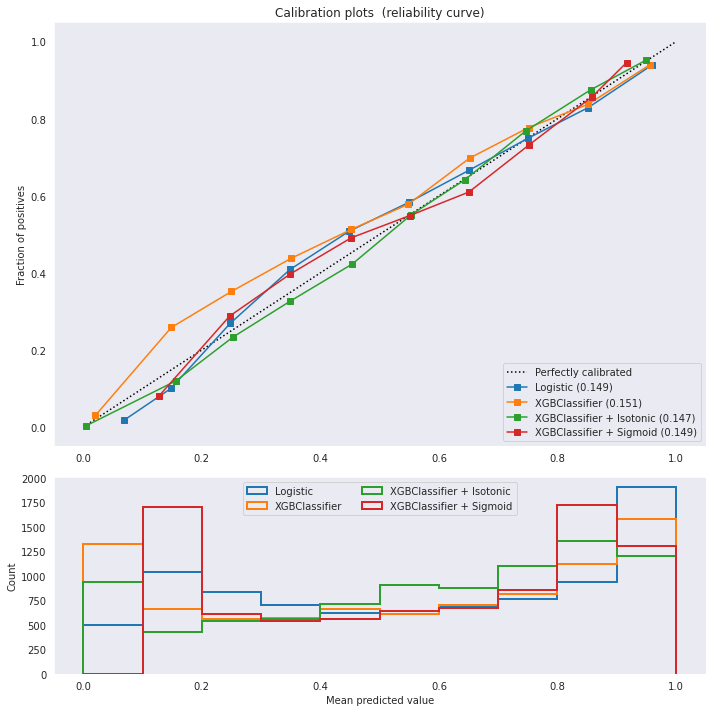

In [27]:
plot_calibration_curve(best_model, "XGBClassifier", 1)

ROC_auc score: 0.8293948149706925


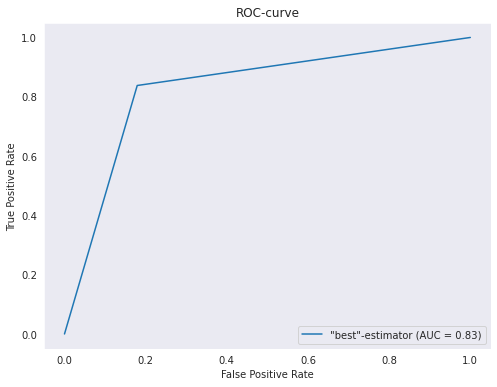

In [28]:
fpr, tpr, thresholds = roc_curve(y_train, pred_train)
roc_auc = auc(fpr, tpr)
print('ROC_auc score: {}'.format(roc_auc))
displayROC = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='"best"-estimator')


fig, ax = plt.subplots(figsize=(8, 6))
plt.title('ROC-curve')
displayROC.plot(ax=ax)  
plt.show()   

In [29]:
pred_test = grid.predict(X_test)

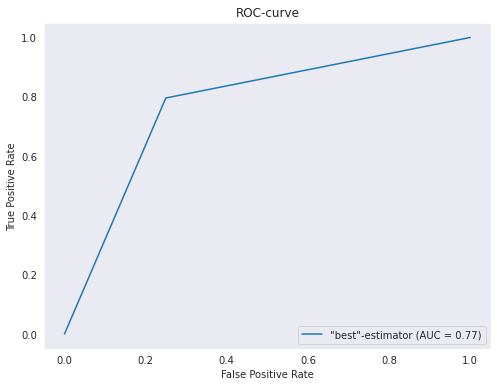

In [30]:
fpr, tpr, thresholds = roc_curve(y_test, pred_test)
roc_auc = auc(fpr, tpr)
displayROC = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='"best"-estimator')

fig, ax = plt.subplots(figsize=(8, 6))
plt.title('ROC-curve')
displayROC.plot(ax=ax)  
plt.show()   

In [31]:
print('Best model predicitons: {}'.format(pred_test))
print('Best model accuracy: {}'.format(accuracy_score(y_test, pred_test)))

Best model predicitons: [1 1 1 ... 0 1 1]
Best model accuracy: 0.776230269266481


### Metrics Train

In [32]:
print('Classification Report:\n{}'.format(classification_report(y_train, pred_train)))
print('Precision = {}'.format(precision_score(y_train, pred_train, average='weighted')))
print('Recall = {}'.format(recall_score(y_train, pred_train, average='weighted')))
print('Accuracy = {}'.format(accuracy_score(y_train, pred_train)))

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.82      0.81     11204
           1       0.86      0.84      0.85     14643

    accuracy                           0.83     25847
   macro avg       0.83      0.83      0.83     25847
weighted avg       0.83      0.83      0.83     25847

Precision = 0.8314485132785742
Recall = 0.8305412620420165
Accuracy = 0.8305412620420165


### Crosstab and heatmap are the same

col_0,0,1
dtg_melding,,
0,9196,2008
1,2372,12271


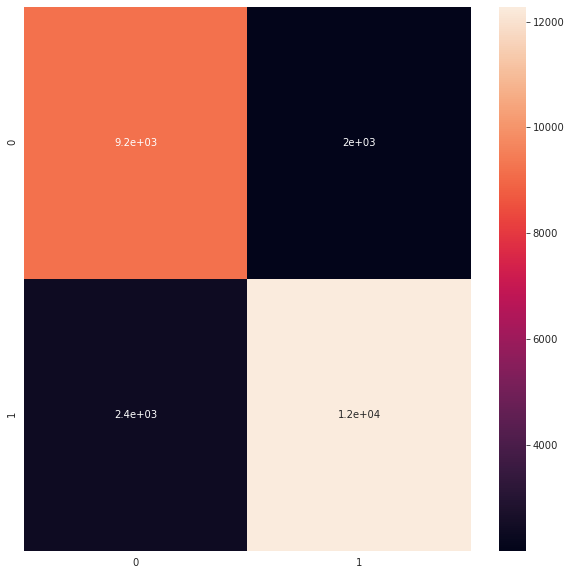

In [33]:
cm = confusion_matrix(y_train, pred_train)
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True)
pd.crosstab(y_train, pred_train)

### Metrics Test

In [34]:
print('Precision = {}'.format(precision_score(y_test, pred_test, average='weighted')))
print('Recall = {}'.format(recall_score(y_test, pred_test, average='weighted')))
print('Accuracy = {}'.format(accuracy_score(y_test, pred_test)))

Precision = 0.7768517465625823
Recall = 0.776230269266481
Accuracy = 0.776230269266481


### Crosstab and heatmap are the same

col_0,0,1
dtg_melding,,
0,2786,927
1,1001,3902


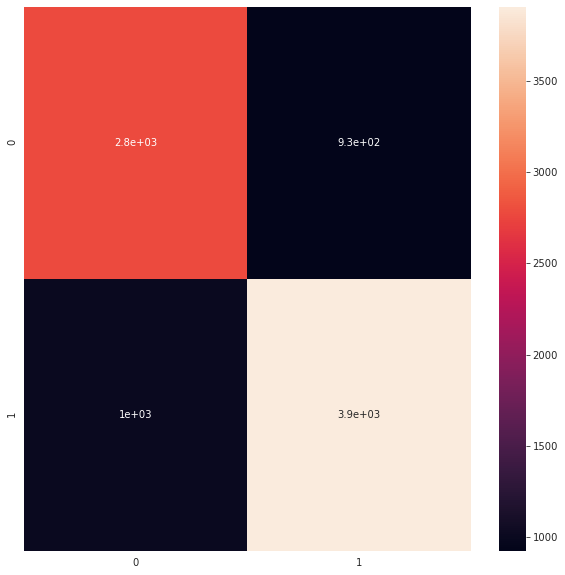

In [35]:
cm = confusion_matrix(y_test, pred_test)
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True)
pd.crosstab(y_test, pred_test)

In [36]:
def plot_learning_curve(estimator, title, X, y, axes=None, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate 3 plots: the test and training learning curve, the training
    samples vs fit times curve, the fit times vs score curve.

    Parameters
    ----------
    estimator : estimator instance
        An estimator instance implementing `fit` and `predict` methods which
        will be cloned for each validation.

    title : str
        Title for the chart.

    X : array-like of shape (n_samples, n_features)
        Training vector, where ``n_samples`` is the number of samples and
        ``n_features`` is the number of features.

    y : array-like of shape (n_samples) or (n_samples, n_features)
        Target relative to ``X`` for classification or regression;
        None for unsupervised learning.

    axes : array-like of shape (3,), default=None
        Axes to use for plotting the curves.

    ylim : tuple of shape (2,), default=None
        Defines minimum and maximum y-values plotted, e.g. (ymin, ymax).

    cv : int, cross-validation generator or an iterable, default=None
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:

          - None, to use the default 5-fold cross-validation,
          - integer, to specify the number of folds.
          - :term:`CV splitter`,
          - An iterable yielding (train, test) splits as arrays of indices.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : int or None, default=None
        Number of jobs to run in parallel.
        ``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.
        ``-1`` means using all processors. See :term:`Glossary <n_jobs>`
        for more details.

    train_sizes : array-like of shape (n_ticks,)
        Relative or absolute numbers of training examples that will be used to
        generate the learning curve. If the ``dtype`` is float, it is regarded
        as a fraction of the maximum size of the training set (that is
        determined by the selected validation method), i.e. it has to be within
        (0, 1]. Otherwise it is interpreted as absolute sizes of the training
        sets. Note that for classification the number of samples usually have
        to be big enough to contain at least one sample from each class.
        (default: np.linspace(0.1, 1.0, 5))
    """
    if axes is None:
        _, axes = plt.subplots(1, 3, figsize=(20, 5))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = \
        learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs,
                       train_sizes=train_sizes,
                       return_times=True)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1,
                         color="r")
    axes[0].fill_between(train_sizes, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1,
                         color="g")
    axes[0].plot(train_sizes, train_scores_mean, 'o-', color="r",
                 label="Training score")
    axes[0].plot(train_sizes, test_scores_mean, 'o-', color="g",
                 label="Cross-validation score")
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, 'o-')
    axes[1].fill_between(train_sizes, fit_times_mean - fit_times_std,
                         fit_times_mean + fit_times_std, alpha=0.1)
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model")

    # Plot fit_time vs score
    axes[2].grid()
    axes[2].plot(fit_times_mean, test_scores_mean, 'o-')
    axes[2].fill_between(fit_times_mean, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1)
    axes[2].set_xlabel("fit_times")
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the model")

    return plt

[16:08:22] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:08:23] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:08:24] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might no

<module 'matplotlib.pyplot' from '/home/smwhering/miniconda3/envs/datasc/lib/python3.7/site-packages/matplotlib/pyplot.py'>

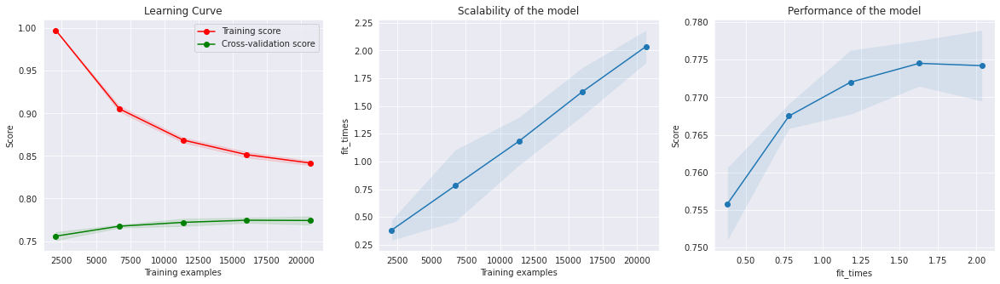

In [37]:
plot_learning_curve(best_model, 'Learning Curve', X_train, y_train)

# The Tree

array(['num__lopend_gemiddelde_2u', 'num__lopend_gemiddelde_6u',
       'num__lopend_gemiddelde_dag', 'num__uitbereidend_gemiddelde',
       'num__Avguur', 'num__Avgdagtijd', 'num__Avgwerktijd',
       'num__Avgdagvanjaar', 'num__AvgweekvJweekDdeelD', 'cat__x0_1',
       'cat__x0_2', 'cat__x0_3', 'cat__x0_4', 'cat__x0_5', 'cat__x0_6',
       'cat__x0_7', 'cat__x0_8', 'cat__x0_9', 'cat__x0_10', 'cat__x0_11',
       'cat__x0_12', 'cat__x1_1', 'cat__x1_2', 'cat__x1_3', 'cat__x1_4',
       'cat__x2_1', 'cat__x2_2', 'cat__x2_3', 'cat__x2_4', 'cat__x2_5',
       'cat__x2_6', 'cat__x2_7', 'cat__x2_8', 'cat__x2_9', 'cat__x2_10',
       'cat__x2_11', 'cat__x2_12', 'cat__x2_13', 'cat__x2_14',
       'cat__x2_15', 'cat__x2_16', 'cat__x2_17', 'cat__x2_18',
       'cat__x2_19', 'cat__x2_20', 'cat__x2_21', 'cat__x2_22',
       'cat__x2_23', 'cat__x2_24', 'cat__x2_25', 'cat__x2_26',
       'cat__x2_27', 'cat__x2_28', 'cat__x2_29', 'cat__x2_30',
       'cat__x2_31', 'cat__x2_32', 'cat__x2_33', 'cat__x

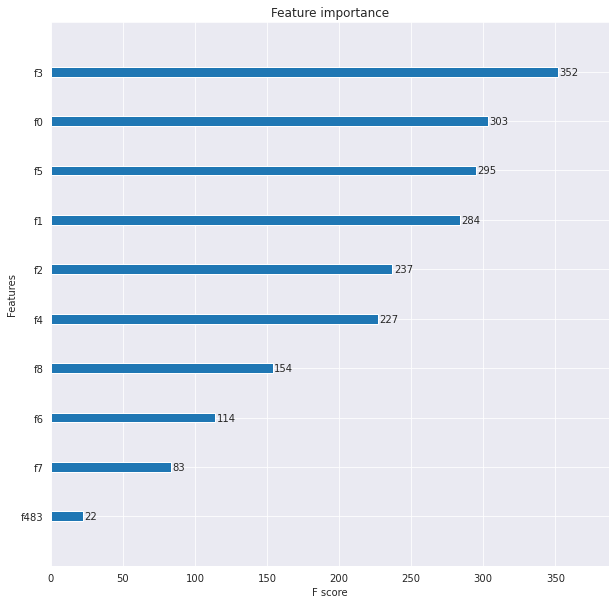

In [38]:
best_model.feature_names = featurenames


# display(featurenames)

xgb.plot_importance(best_model, max_num_features=10)
fig = plt.gcf()
fig.set_size_inches(10, 10)

idx = best_model.feature_importances_.argsort()[::-1][:10]
featurenames = np.array(featurenames)

featurenames[idx]

featurenames

In [39]:
xgb.plot_tree(best_model, rankdir='LR')
fig = plt.gcf()
fig.set_size_inches(200, 400)
fig.savefig("tree_Algemeen", transparent=True, format='png')



### Wijken


In [126]:
df.head()

,dtg_melding,plaatscode,plaatsnaam,wijkcode,naam_locatie_1,long,lat
interval,,,,,,,
2018-11-06 11:57:24.999264,2018-11-06 11:57:24.999264,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.65179,51.85761
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.65179,51.85761
2018-11-06 11:57:29.999232,2018-11-06 11:57:29.999232,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.65179,51.85761
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.65179,51.85761
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.65179,51.85761


In [127]:
df_mod= df.groupby('wijkcode').resample('4H').agg({'dtg_melding': 'count'})
df_mod = df_mod.reset_index('wijkcode')
df_mod['dtg_melding'] = df_mod['dtg_melding'].astype(int)

print(df_mod.shape)
display(df_mod.head(5))

(715393, 2)


,wijkcode,dtg_melding
interval,,
2018-07-11 16:00:00,WK026805,1
2018-07-11 20:00:00,WK026805,0
2018-07-12 00:00:00,WK026805,0
2018-07-12 04:00:00,WK026805,0
2018-07-12 08:00:00,WK026805,0


In [128]:
mean = df_mod.groupby('wijkcode').sum().mean()[0]

df_filter = df_mod.groupby('wijkcode').sum().reset_index()
df_filter = list(df_filter[df_filter['dtg_melding'] > 1000].wijkcode)
display(df_filter)

df_mod = df_mod[df_mod['wijkcode'].isin(df_filter)]

df_mod

['WK050501',
 'WK050502',
 'WK050503',
 'WK050505',
 'WK050506',
 'WK050507',
 'WK050508',
 'WK050509',
 'WK050510',
 'WK050511',
 'WK051206',
 'WK052300',
 'WK053101',
 'WK059000',
 'WK061002',
 'WK061003',
 'WK064201',
 'WK064203',
 'WK064205',
 'WK196300',
 'WK196307',
 'WK196308',
 'WK196309']

,wijkcode,dtg_melding
interval,,
2018-05-15 04:00:00,WK050501,2
2018-05-15 08:00:00,WK050501,0
2018-05-15 12:00:00,WK050501,0
2018-05-15 16:00:00,WK050501,0
2018-05-15 20:00:00,WK050501,1
...,...,...
2020-04-30 08:00:00,WK196309,1
2020-04-30 12:00:00,WK196309,1
2020-04-30 16:00:00,WK196309,0


In [129]:
# print(type(df_mod.index))
# df_mod['jaar'] = pd.DatetimeIndex(df_mod.index).year
df_mod['maand'] = pd.DatetimeIndex(df_mod.index).month
df_mod['kwartaal'] = pd.DatetimeIndex(df_mod.index).quarter
df_mod['weekvanjaar'] = pd.DatetimeIndex(df_mod.index).isocalendar().week
df_mod['weekdag'] = pd.DatetimeIndex(df_mod.index).weekday
df_mod['dagvanjaar'] = pd.DatetimeIndex(df_mod.index).dayofyear
df_mod['dag'] = pd.DatetimeIndex(df_mod.index).day
df_mod['dagdeel'] = pd.DatetimeIndex(df_mod.index).hour
df_mod['werktijd'] = pd.DatetimeIndex(df_mod.index).hour
df_mod['werkdag'] = pd.DatetimeIndex(df_mod.index).weekday < 5
df_mod['lopend_gemiddelde_12u'] = df_mod['dtg_melding'].rolling(window=2, min_periods=1).mean()
df_mod['lopend_gemiddelde_2dagen'] = df_mod['dtg_melding'].rolling(window=8, min_periods=1).mean()
df_mod['uitbereidend_gemiddelde'] = df_mod['dtg_melding'].expanding(min_periods=1).mean()
df_mod['weekend'] = df_mod['weekdag'] > 4


bins = [-np.inf, 6, 12, 18, 24]
dagdelen = ['nacht','ochtend', 'middag', 'avond']
df_mod['dagdeel'] = pd.cut(df_mod['dagdeel'], bins, labels=dagdelen)

bins = [0, 91, 183, 275, 366]
seizoenen = labels=['winter', 'lente', 'zomer', 'herfst']
df_mod['seizoen'] = pd.cut((df_mod.dag + 11) % 366, bins=bins, labels=seizoenen)

feestdagenData = pd.to_datetime(list(holidays.NL(years=[2018, 2019, 2020]).keys()))
feestdagenNamen = list(holidays.NL(years=[2018, 2019, 2020]).values())
df_mod['feestdag'] = df_mod.index.isin(feestdagenData.values)

df_mod['werktijd'] = df_mod['werktijd'].apply(lambda x: werktijd(x))

print(df_mod.shape)
print(df_mod.columns)
# df_mod.head(5)

(98952, 17)
Index(['wijkcode', 'dtg_melding', 'maand', 'kwartaal', 'weekvanjaar',
       'weekdag', 'dagvanjaar', 'dag', 'dagdeel', 'werktijd', 'werkdag',
       'lopend_gemiddelde_12u', 'lopend_gemiddelde_2dagen',
       'uitbereidend_gemiddelde', 'weekend', 'seizoen', 'feestdag'],
      dtype='object')


In [130]:
Avgwerktijd = df_mod.groupby(['wijkcode', 'weekvanjaar','weekdag', 'werktijd']).agg(Avgwerktijd=('dtg_melding', 'mean'))
Avgdagvanjaar = df_mod.groupby(['wijkcode', 'dagvanjaar']).agg(Avgdagvanjaar=('dtg_melding', 'mean'))
AvgweekvJweekDdeelD = df_mod.groupby(['wijkcode', 'weekvanjaar','weekdag', 'dagdeel']).agg(AvgweekvJweekDdeelD=('dtg_melding', 'mean'))

df_mod = df_mod.merge(Avgwerktijd, on=['wijkcode', 'weekvanjaar','weekdag', 'werktijd'])
df_mod = df_mod.merge(Avgdagvanjaar, on=['wijkcode', 'dagvanjaar'])
df_mod = df_mod.merge(AvgweekvJweekDdeelD, on=['wijkcode', 'weekvanjaar','weekdag', 'dagdeel'])
df_mod.head(10)

,wijkcode,dtg_melding,maand,kwartaal,weekvanjaar,weekdag,dagvanjaar,dag,dagdeel,werktijd,werkdag,lopend_gemiddelde_12u,lopend_gemiddelde_2dagen,uitbereidend_gemiddelde,weekend,seizoen,feestdag,Avgwerktijd,Avgdagvanjaar,AvgweekvJweekDdeelD
0,WK050501,2,5,2,20,1,135,15,nacht,False,True,2.0,2.000000,2.000000,False,winter,False,0.571429,0.363636,0.666667
1,WK050501,0,5,2,20,1,134,14,nacht,False,True,0.0,0.125000,0.477106,False,winter,False,0.571429,0.500000,0.666667
2,WK050501,0,5,2,20,1,134,14,nacht,False,True,0.0,0.125000,0.476888,False,winter,False,0.571429,0.500000,0.666667
3,WK050501,0,5,2,20,1,135,15,ochtend,False,True,1.0,1.000000,1.000000,False,winter,False,0.571429,0.363636,0.250000
4,WK050501,0,5,2,20,1,135,15,ochtend,True,True,0.0,0.666667,0.666667,False,winter,False,0.500000,0.363636,0.250000
5,WK050501,1,5,2,20,1,134,14,ochtend,False,True,0.5,0.250000,0.477127,False,winter,False,0.571429,0.500000,0.250000
6,WK050501,0,5,2,20,1,134,14,ochtend,True,True,0.5,0.250000,0.476909,False,winter,False,0.500000,0.500000,0.250000
7,WK050501,1,5,2,20,1,135,15,avond,False,True,0.5,0.600000,0.600000,False,winter,False,0.571429,0.363636,0.500000
8,WK050501,0,5,2,20,1,134,14,avond,False,True,1.0,0.375000,0.477387,False,winter,False,0.571429,0.500000,0.500000
9,WK050501,0,5,2,20,1,135,15,middag,True,True,0.0,0.500000,0.500000,False,winter,False,0.500000,0.363636,1.000000


<AxesSubplot:xlabel='dtg_melding', ylabel='count'>

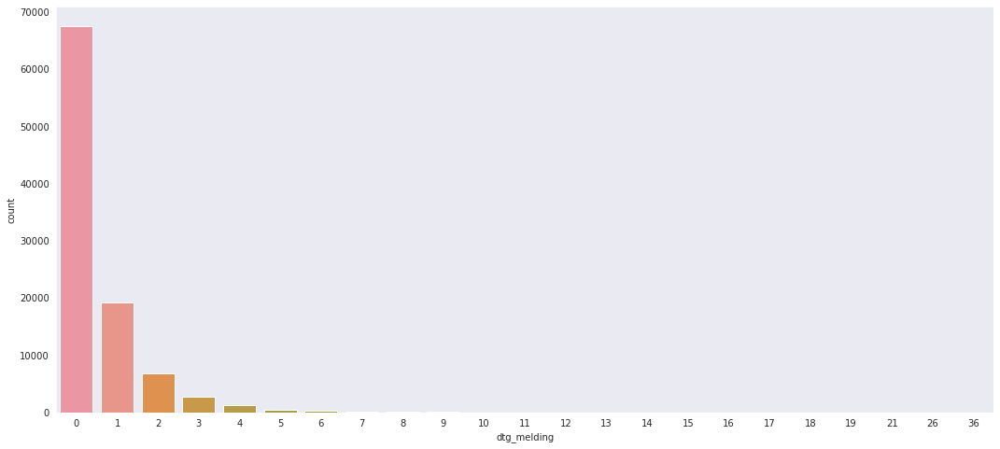

In [131]:
# distro = df_mod.dtg_melding.value_counts()
# print(distro)
plt.figure(figsize=(18,8))
sns.countplot(x='dtg_melding', data=df_mod)

In [132]:
# df_mod.hist(bins=30, figsize=(20,20), color='g')

In [133]:
# sns.pairplot(df_mod)

<AxesSubplot:>

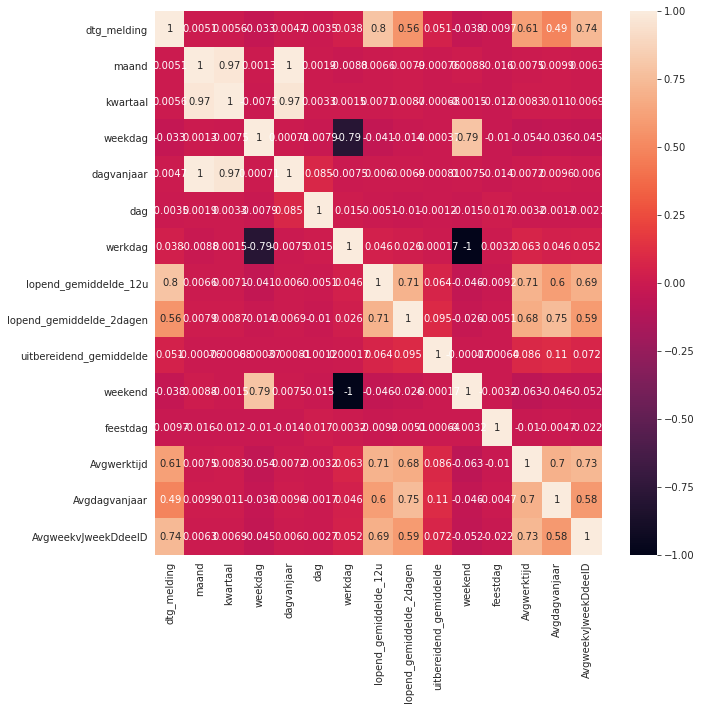

In [134]:
plt.figure(figsize=(10,10))
corr_matrix = df_mod.corr()
sns.heatmap(corr_matrix, annot=True)

In [135]:
df_mod['dtg_melding'] = df_mod['dtg_melding'] > 1
df_mod['dtg_melding'] = df_mod['dtg_melding'].astype(int)
# df_mod['dtg_melding'] = df_mod['dtg_melding'].apply(lambda x: melding_label(x))
df_mod.head()

,wijkcode,dtg_melding,maand,kwartaal,weekvanjaar,weekdag,dagvanjaar,dag,dagdeel,werktijd,werkdag,lopend_gemiddelde_12u,lopend_gemiddelde_2dagen,uitbereidend_gemiddelde,weekend,seizoen,feestdag,Avgwerktijd,Avgdagvanjaar,AvgweekvJweekDdeelD
0,WK050501,1,5,2,20,1,135,15,nacht,False,True,2.0,2.000000,2.000000,False,winter,False,0.571429,0.363636,0.666667
1,WK050501,0,5,2,20,1,134,14,nacht,False,True,0.0,0.125000,0.477106,False,winter,False,0.571429,0.500000,0.666667
2,WK050501,0,5,2,20,1,134,14,nacht,False,True,0.0,0.125000,0.476888,False,winter,False,0.571429,0.500000,0.666667
3,WK050501,0,5,2,20,1,135,15,ochtend,False,True,1.0,1.000000,1.000000,False,winter,False,0.571429,0.363636,0.250000
4,WK050501,0,5,2,20,1,135,15,ochtend,True,True,0.0,0.666667,0.666667,False,winter,False,0.500000,0.363636,0.250000


<AxesSubplot:>

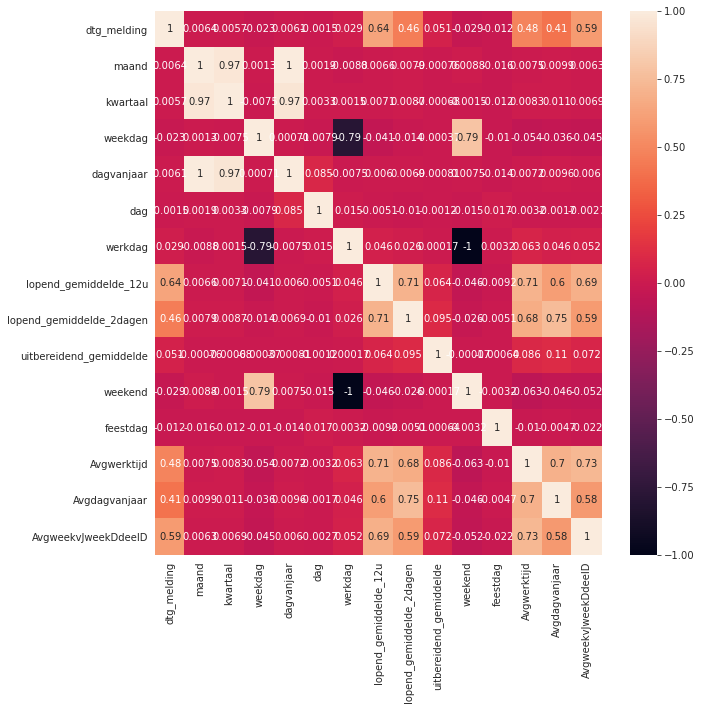

In [136]:
plt.figure(figsize=(10,10))
corr_matrix = df_mod.corr()
sns.heatmap(corr_matrix, annot=True)

0.1233830544102191
(98952, 20)
Ratio 0: 0.8766169455897809
Ratio 1: 0.1233830544102191


<AxesSubplot:title={'center':'Ratios'}, xlabel='dtg_melding', ylabel='count'>

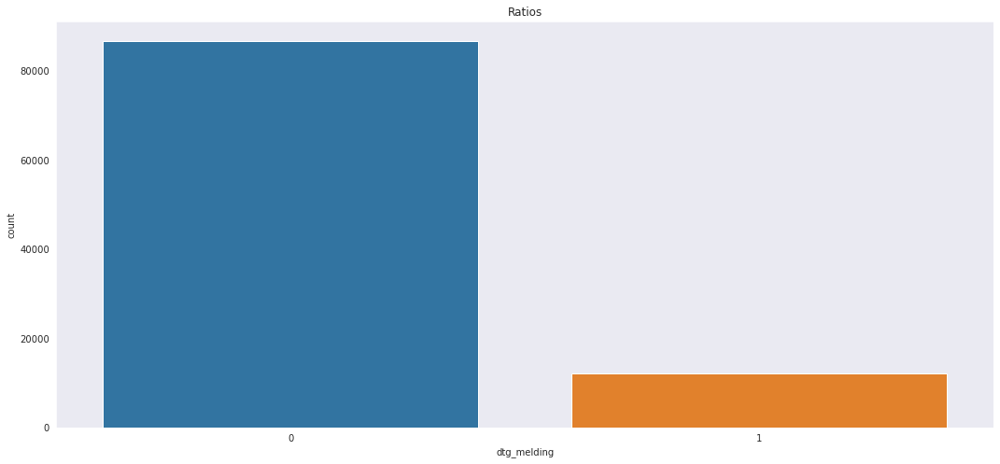

In [137]:
print(df_mod.dtg_melding.mean())
ratio_0 = df_mod.dtg_melding[df_mod.dtg_melding == 0].count()/df_mod.shape[0]
ratio_1 = df_mod.dtg_melding[df_mod.dtg_melding == 1].count()/df_mod.shape[0]
print(df_mod.shape)
print('Ratio 0: {}'.format(ratio_0))
print('Ratio 1: {}'.format(ratio_1))

plt.figure(figsize=(18,8))
plt.title('Ratios')
sns.countplot(x='dtg_melding', data=df_mod)

In [138]:
# print(df_mod.columns)
# df_mod.info()
# print(df_mod.isnull().sum())
display(df_mod.head(10))

,wijkcode,dtg_melding,maand,kwartaal,weekvanjaar,weekdag,dagvanjaar,dag,dagdeel,werktijd,werkdag,lopend_gemiddelde_12u,lopend_gemiddelde_2dagen,uitbereidend_gemiddelde,weekend,seizoen,feestdag,Avgwerktijd,Avgdagvanjaar,AvgweekvJweekDdeelD
0,WK050501,1,5,2,20,1,135,15,nacht,False,True,2.0,2.000000,2.000000,False,winter,False,0.571429,0.363636,0.666667
1,WK050501,0,5,2,20,1,134,14,nacht,False,True,0.0,0.125000,0.477106,False,winter,False,0.571429,0.500000,0.666667
2,WK050501,0,5,2,20,1,134,14,nacht,False,True,0.0,0.125000,0.476888,False,winter,False,0.571429,0.500000,0.666667
3,WK050501,0,5,2,20,1,135,15,ochtend,False,True,1.0,1.000000,1.000000,False,winter,False,0.571429,0.363636,0.250000
4,WK050501,0,5,2,20,1,135,15,ochtend,True,True,0.0,0.666667,0.666667,False,winter,False,0.500000,0.363636,0.250000
5,WK050501,0,5,2,20,1,134,14,ochtend,False,True,0.5,0.250000,0.477127,False,winter,False,0.571429,0.500000,0.250000
6,WK050501,0,5,2,20,1,134,14,ochtend,True,True,0.5,0.250000,0.476909,False,winter,False,0.500000,0.500000,0.250000
7,WK050501,0,5,2,20,1,135,15,avond,False,True,0.5,0.600000,0.600000,False,winter,False,0.571429,0.363636,0.500000
8,WK050501,0,5,2,20,1,134,14,avond,False,True,1.0,0.375000,0.477387,False,winter,False,0.571429,0.500000,0.500000
9,WK050501,0,5,2,20,1,135,15,middag,True,True,0.0,0.500000,0.500000,False,winter,False,0.500000,0.363636,1.000000


In [139]:
print(df_mod.shape)

target = df_mod['dtg_melding']
features  = df_mod.drop(columns=['dtg_melding'])

y = target
X = features
print(X.shape, y.shape)


(98952, 20)
(98952, 19) (98952,)


In [140]:
# count examples in each class
counter = Counter(y)
# estimate scale_pos_weight value
estimate = counter[0] / counter[1]
print('Estimate: %.3f' % estimate)

Estimate: 7.105


In [141]:
print(df_mod.columns)

Index(['wijkcode', 'dtg_melding', 'maand', 'kwartaal', 'weekvanjaar',
       'weekdag', 'dagvanjaar', 'dag', 'dagdeel', 'werktijd', 'werkdag',
       'lopend_gemiddelde_12u', 'lopend_gemiddelde_2dagen',
       'uitbereidend_gemiddelde', 'weekend', 'seizoen', 'feestdag',
       'Avgwerktijd', 'Avgdagvanjaar', 'AvgweekvJweekDdeelD'],
      dtype='object')


## GridSearch
This finds the best parameters for the model.
When finished it returns the best model

In [142]:
numeric_features = ['lopend_gemiddelde_12u', 'lopend_gemiddelde_2dagen', 'uitbereidend_gemiddelde','Avgwerktijd', 'Avgdagvanjaar', 'AvgweekvJweekDdeelD']
numeric_transformer = MinMaxScaler()

categorical_features = ['wijkcode', 'maand', 'kwartaal', 'weekvanjaar', 'weekdag', 'dagvanjaar', 'dag', 'dagdeel', 'werktijd', 'werkdag', 'weekend', 'seizoen', 'feestdag']
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])


trans_X = preprocessor.fit_transform(X)

featurenames = get_feature_names(preprocessor)
# featurenames

/home/smwhering/miniconda3/envs/datasc/lib/python3.7/site-packages/ipykernel_launcher.py:33: UserWarning:

Transformer num (type MinMaxScaler) does not provide get_feature_names. Will return input column names if available



In [143]:
X_train, X_test, y_train, y_test = train_test_split(trans_X, y, train_size=0.75, random_state=0)

In [144]:
model = xgb.XGBClassifier(objective='binary:logistic',
                          eval_metric= 'logloss',
                          scale_pos_weight=estimate,
                          early_stopping_rounds=50,
                          use_label_encoder=False,
                          n_jobs=-1,
                          verbose=2)

param_grid = {
    'classifier__gamma':[1,5,12],
    'classifier__booster':['gbtree', 'dart'],
    'classifier__learning_rate':[1, 5],
    'classifier__n_estimators':[20, 400],
    'classifier__max_depth': [3,6],
    'classifier__reg_alpha': [0, 0.8],
    'classifier__reg_lambda': [0.5, 0.6],}

grid = GridSearchCV(model, cv=2, n_jobs=-1, param_grid=param_grid, verbose=3)
grid.fit(X_train, y_train)
print("model score: %.3f" % grid.score(X_test, y_test))

Fitting 2 folds for each of 192 candidates, totalling 384 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   32.4s
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 384 out of 384 | elapsed: 18.0min finished


[17:41:38] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { classifier__booster, classifier__gamma, classifier__learning_rate, classifier__max_depth, classifier__n_estimators, classifier__reg_alpha, classifier__reg_lambda, early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


model score: 0.939


#### Best model

In [145]:
best_model = grid.estimator
# print(best_model)
best_model.fit(X_train, y_train)
pred_train = best_model.predict(X_train)
probabilities = best_model.predict_proba(X_train)

[17:41:44] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




In [146]:
print(probabilities)

[[9.9997747e-01 2.2519487e-05]
 [9.9999964e-01 3.3011599e-07]
 [9.9976689e-01 2.3309540e-04]
 ...
 [9.9991161e-01 8.8391884e-05]
 [1.1892098e-01 8.8107902e-01]
 [9.9984258e-01 1.5739229e-04]]


ROC_auc score: 0.9678601613522858


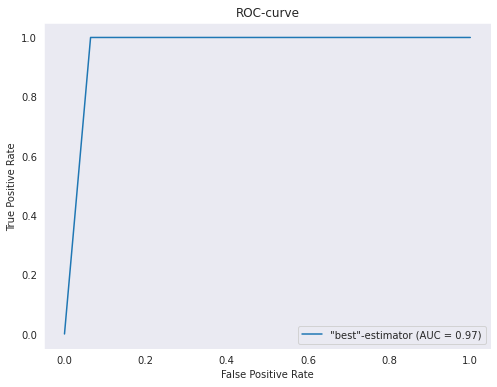

In [147]:
fpr, tpr, thresholds = roc_curve(y_train, pred_train)
roc_auc = auc(fpr, tpr)
print('ROC_auc score: {}'.format(roc_auc))
displayROC = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='"best"-estimator')


fig, ax = plt.subplots(figsize=(8, 6))
plt.title('ROC-curve')
displayROC.plot(ax=ax)  
plt.show()   

In [148]:
pred_test = grid.predict(X_test)

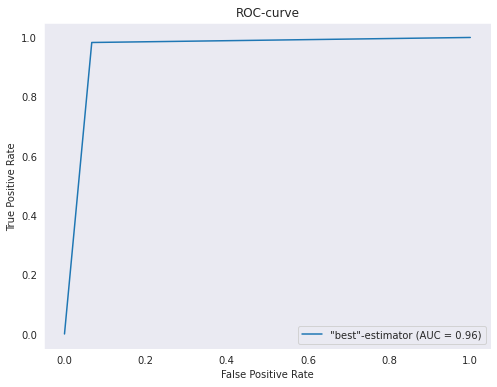

In [149]:
fpr, tpr, thresholds = roc_curve(y_test, pred_test)
roc_auc = auc(fpr, tpr)
displayROC = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='"best"-estimator')

fig, ax = plt.subplots(figsize=(8, 6))
plt.title('ROC-curve')
displayROC.plot(ax=ax)  
plt.show()   

In [150]:
print('Best model predicitons: {}'.format(pred_test))
print('Best model accuracy: {}'.format(accuracy_score(y_test, pred_test)))

Best model predicitons: [0 0 0 ... 0 0 0]
Best model accuracy: 0.9390411512652599


### Metrics Train

In [151]:
print('Classification Report:\n{}'.format(classification_report(y_train, pred_train)))
print('Precision = {}'.format(precision_score(y_train, pred_train, average='weighted')))
print('Recall = {}'.format(recall_score(y_train, pred_train, average='weighted')))
print('Accuracy = {}'.format(accuracy_score(y_train, pred_train)))
pd.crosstab(y_train, pred_train)

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     65075
           1       0.69      1.00      0.81      9139

    accuracy                           0.94     74214
   macro avg       0.84      0.97      0.89     74214
weighted avg       0.96      0.94      0.95     74214

Precision = 0.961333819614568
Recall = 0.943635971649554
Accuracy = 0.943635971649554


col_0,0,1
dtg_melding,,
0,60892,4183
1,0,9139


<AxesSubplot:>

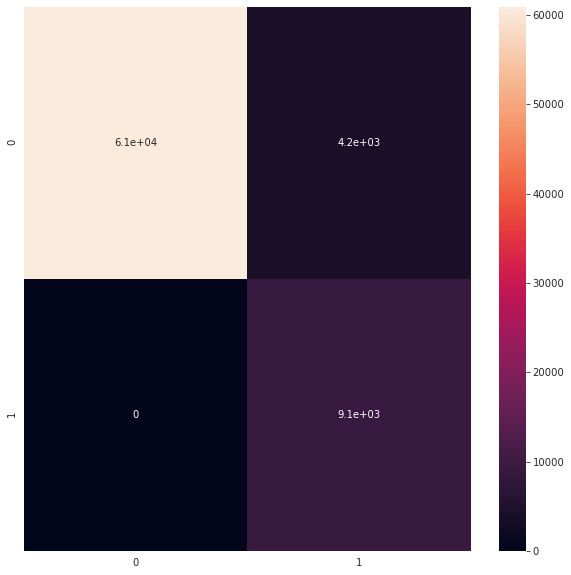

In [152]:
cm = confusion_matrix(y_train, pred_train)
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True)

### Metrics Test

In [153]:
print('Precision = {}'.format(precision_score(y_test, pred_test, average='weighted')))
print('Recall = {}'.format(recall_score(y_test, pred_test, average='weighted')))
print('Accuracy = {}'.format(accuracy_score(y_test, pred_test)))

Precision = 0.9573655547396231
Recall = 0.9390411512652599
Accuracy = 0.9390411512652599


<AxesSubplot:>

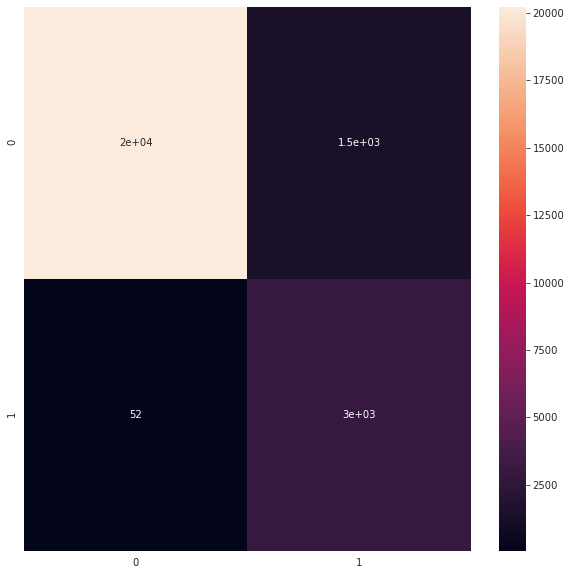

In [154]:
cm = confusion_matrix(y_test, pred_test)
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True)

[17:41:50] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:41:51] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:41:52] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might no

<module 'matplotlib.pyplot' from '/home/smwhering/miniconda3/envs/datasc/lib/python3.7/site-packages/matplotlib/pyplot.py'>

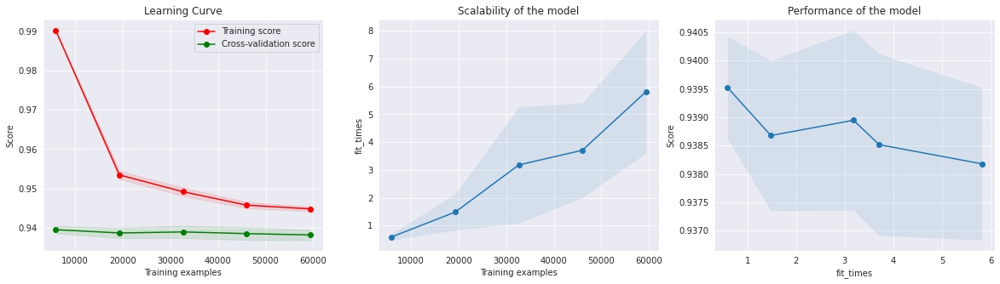

In [155]:
plot_learning_curve(best_model, 'Learning Curve', X_train, y_train)

## Reliability Graph

/home/smwhering/miniconda3/envs/datasc/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Logistic:
	Brier: 0.054
	Precision: 0.783
	Recall: 0.520
	F1: 0.625

[17:43:16] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


XGBClassifier:
	Brier: 0.045
	Precision: 0.675
	Recall: 0.983
	F1: 0.800

[17:43:31] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:43:36] WARNING: /ho

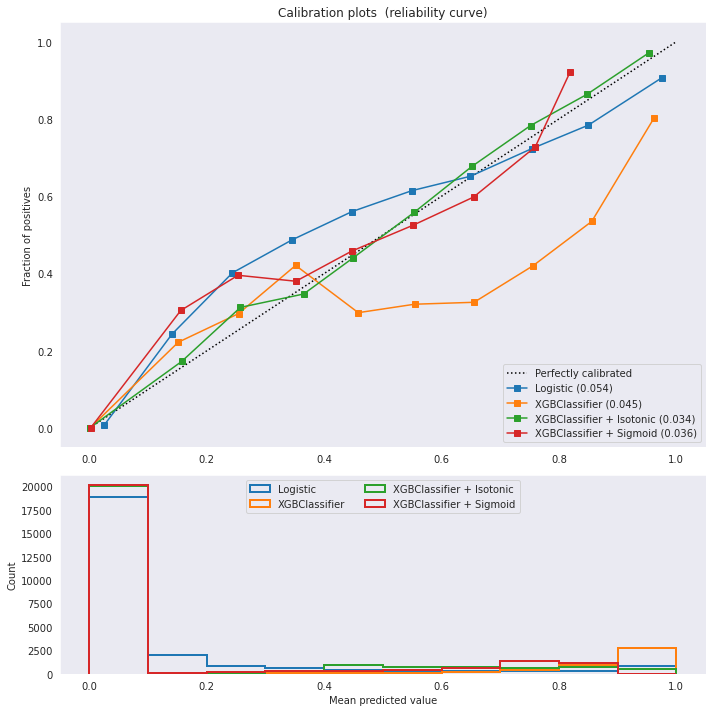

In [156]:
plot_calibration_curve(best_model, "XGBClassifier", 1)

# The Tree

array(['num__lopend_gemiddelde_12u', 'cat__x7_avond',
       'num__AvgweekvJweekDdeelD', 'cat__x7_middag', 'cat__x8_False',
       'cat__x7_nacht', 'cat__x3_19', 'num__Avgwerktijd', 'cat__x3_47',
       'cat__x0_WK050510'], dtype='<U29')

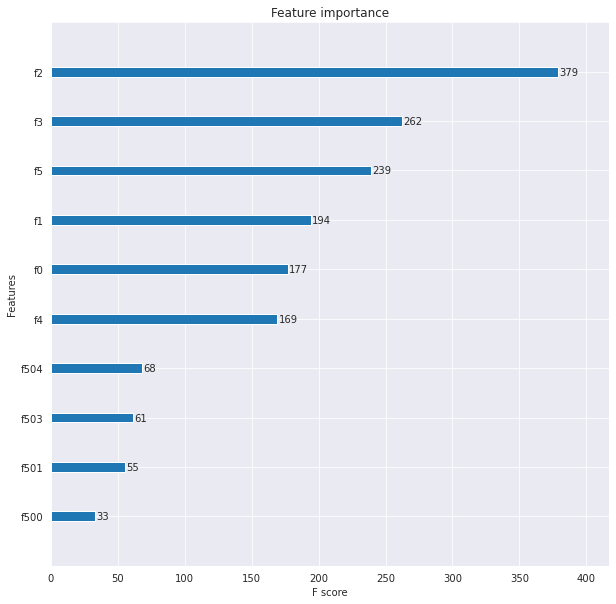

In [157]:
best_model.feature_names = featurenames


# display(featurenames)

xgb.plot_importance(best_model, max_num_features=10)
fig = plt.gcf()
fig.set_size_inches(10, 10)

idx = best_model.feature_importances_.argsort()[::-1][:10]
featurenames = np.array(featurenames)

featurenames[idx]

# featurenames

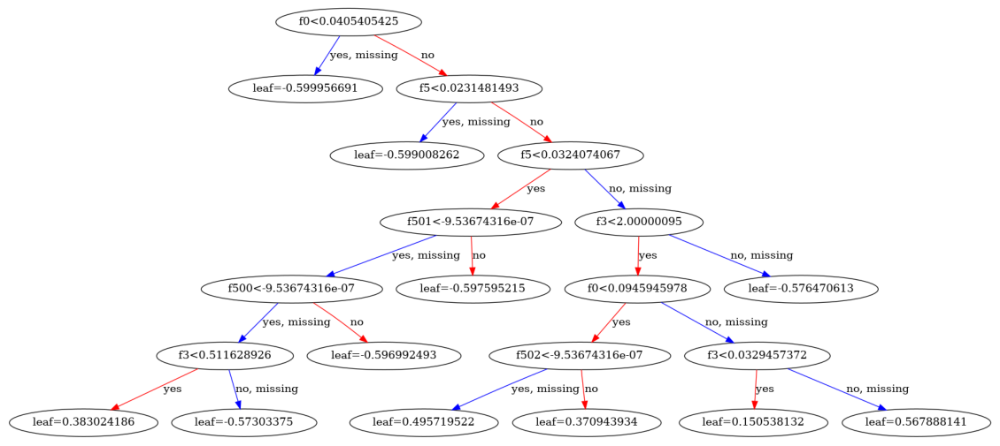

In [158]:
xgb.plot_tree(best_model)
fig = plt.gcf()
fig.set_size_inches(20, 30)
fig.savefig("tree_Wijken.png", transparent=True, format='png')

### Gemeenten

In [73]:
df.head()

,dtg_melding,plaatscode,plaatsnaam,wijkcode,naam_locatie_1,long,lat
interval,,,,,,,
2018-11-06 11:57:24.999264,2018-11-06 11:57:24.999264,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.65179,51.85761
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.65179,51.85761
2018-11-06 11:57:29.999232,2018-11-06 11:57:29.999232,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.65179,51.85761
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.65179,51.85761
2018-11-06 11:58:57.999360,2018-11-06 11:58:57.999360,GM0531,Hendrik-Ido-Ambacht,WK053105,A15 L - NOORDTUNNEL,4.65179,51.85761


In [74]:
df_mod= df.groupby('plaatscode').resample('4H').agg({'dtg_melding': 'count'})
df_mod = df_mod.reset_index('plaatscode')
df_mod['dtg_melding'] = df_mod['dtg_melding'].astype(int)
df_mod.sort_values(by=['interval', 'plaatscode'])

print(df_mod.shape)
display(df_mod.head(5))

(116629, 2)


,plaatscode,dtg_melding
interval,,
2018-07-11 16:00:00,GM0268,1
2018-07-11 20:00:00,GM0268,0
2018-07-12 00:00:00,GM0268,0
2018-07-12 04:00:00,GM0268,0
2018-07-12 08:00:00,GM0268,0


In [75]:
# mean = df_mod.groupby('statnaam').sum().mean()[0]
# print(mean)

df_filter = df_mod.groupby('plaatscode').sum().reset_index()
df_filter = list(df_filter[df_filter['dtg_melding'] > 1500].plaatscode)

display(df_filter)

df_mod = df_mod[df_mod['plaatscode'].isin(df_filter)]

df_mod

['GM0482',
 'GM0505',
 'GM0512',
 'GM0523',
 'GM0531',
 'GM0590',
 'GM0597',
 'GM0610',
 'GM0642',
 'GM1961',
 'GM1963',
 'GM1978']

,plaatscode,dtg_melding
interval,,
2018-05-15 04:00:00,GM0482,2
2018-05-15 08:00:00,GM0482,0
2018-05-15 12:00:00,GM0482,0
2018-05-15 16:00:00,GM0482,0
2018-05-15 20:00:00,GM0482,1
...,...,...
2020-05-01 04:00:00,GM1978,1
2020-05-01 08:00:00,GM1978,1
2020-05-01 12:00:00,GM1978,0


In [76]:
# print(type(df_mod.index))
# df_mod['jaar'] = pd.DatetimeIndex(df_mod.index).year
df_mod['maand'] = pd.DatetimeIndex(df_mod.index).month
df_mod['kwartaal'] = pd.DatetimeIndex(df_mod.index).quarter
df_mod['weekvanjaar'] = pd.DatetimeIndex(df_mod.index).isocalendar().week
df_mod['weekdag'] = pd.DatetimeIndex(df_mod.index).weekday
df_mod['dagvanjaar'] = pd.DatetimeIndex(df_mod.index).dayofyear
df_mod['dag'] = pd.DatetimeIndex(df_mod.index).day
df_mod['dagdeel'] = pd.DatetimeIndex(df_mod.index).hour
df_mod['werktijd'] = pd.DatetimeIndex(df_mod.index).hour
df_mod['werkdag'] = pd.DatetimeIndex(df_mod.index).weekday < 5
df_mod['lopend_gemiddelde_dag'] = df_mod['dtg_melding'].rolling(window=2, min_periods=1).mean()
df_mod['lopend_gemiddelde_2dagen'] = df_mod['dtg_melding'].rolling(window=4, min_periods=1).mean()
df_mod['uitbereidend_gemiddelde'] = df_mod['dtg_melding'].expanding(min_periods=1).mean()
df_mod['weekend'] = df_mod['weekdag'] > 4


bins = [-np.inf, 12, 24]
dagdelen = ['nacht/ochtend', 'middag/avond']
df_mod['dagdeel'] = pd.cut(df_mod['dagdeel'], bins, labels=dagdelen)

bins = [0, 91, 183, 275, 366]
seizoenen = labels=['winter', 'lente', 'zomer', 'herfst']
df_mod['seizoen'] = pd.cut((df_mod.dag + 11) % 366, bins=bins, labels=seizoenen)

feestdagenData = pd.to_datetime(list(holidays.NL(years=[2018, 2019, 2020]).keys()))
feestdagenNamen = list(holidays.NL(years=[2018, 2019, 2020]).values())
df_mod['feestdag'] = df_mod.index.isin(feestdagenData.values)

In [77]:
# Avgwerktijd = df_mod.groupby(['statnaam', 'weekvanjaar','weekdag', 'werktijd']).agg(Avgwerktijd=('dtg_melding', 'mean'))
Avgdagvanjaar = df_mod.groupby(['plaatscode', 'dagvanjaar']).agg(Avgdagvanjaar=('dtg_melding', 'mean'))
AvgweekvJweekD = df_mod.groupby(['plaatscode', 'weekvanjaar','weekdag']).agg(AvgweekvJweekD=('dtg_melding', 'mean'))

# df_mod = df_mod.merge(Avgwerktijd, on=['statnaam', 'weekvanjaar','weekdag', 'werktijd'])
df_mod = df_mod.merge(Avgdagvanjaar, on=['plaatscode', 'dagvanjaar'])
df_mod = df_mod.merge(AvgweekvJweekD, on=['plaatscode', 'weekvanjaar','weekdag'])
df_mod.head(10)

,plaatscode,dtg_melding,maand,kwartaal,weekvanjaar,weekdag,dagvanjaar,dag,dagdeel,werktijd,werkdag,lopend_gemiddelde_dag,lopend_gemiddelde_2dagen,uitbereidend_gemiddelde,weekend,seizoen,feestdag,Avgdagvanjaar,AvgweekvJweekD
0,GM0482,2,5,2,20,1,135,15,nacht/ochtend,4,True,2.0,2.000000,2.000000,False,winter,False,0.727273,0.454545
1,GM0482,0,5,2,20,1,135,15,nacht/ochtend,8,True,1.0,1.000000,1.000000,False,winter,False,0.727273,0.454545
2,GM0482,0,5,2,20,1,135,15,nacht/ochtend,12,True,0.0,0.666667,0.666667,False,winter,False,0.727273,0.454545
3,GM0482,0,5,2,20,1,135,15,middag/avond,16,True,0.0,0.500000,0.500000,False,winter,False,0.727273,0.454545
4,GM0482,1,5,2,20,1,135,15,middag/avond,20,True,0.5,0.250000,0.600000,False,winter,False,0.727273,0.454545
5,GM0482,0,5,2,20,1,134,14,nacht/ochtend,0,True,0.5,0.250000,0.572802,False,winter,False,0.333333,0.454545
6,GM0482,0,5,2,20,1,134,14,nacht/ochtend,4,True,0.0,0.250000,0.572540,False,winter,False,0.333333,0.454545
7,GM0482,1,5,2,20,1,134,14,nacht/ochtend,8,True,0.5,0.500000,0.572736,False,winter,False,0.333333,0.454545
8,GM0482,0,5,2,20,1,134,14,nacht/ochtend,12,True,0.5,0.250000,0.572474,False,winter,False,0.333333,0.454545
9,GM0482,1,5,2,20,1,134,14,middag/avond,16,True,0.5,0.500000,0.572669,False,winter,False,0.333333,0.454545


<AxesSubplot:xlabel='dtg_melding', ylabel='count'>

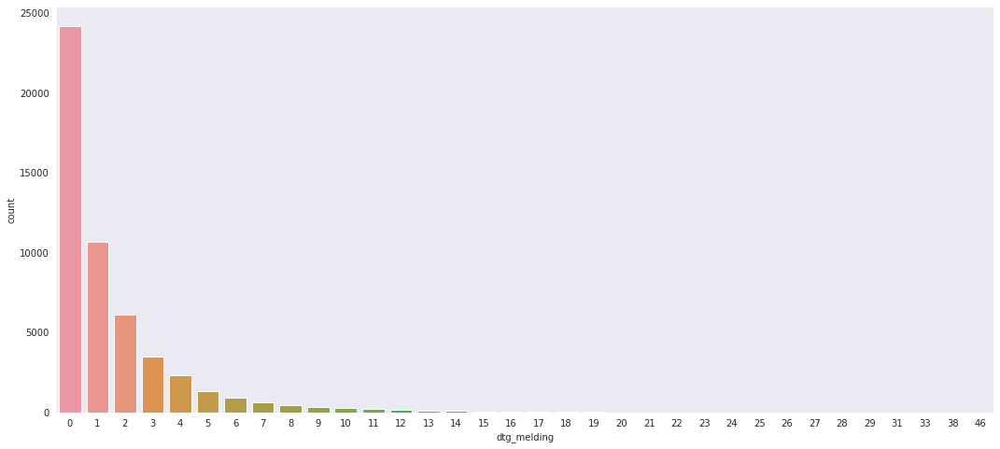

In [78]:
# distro = df_mod.dtg_melding.value_counts()
# print(distro)
plt.figure(figsize=(18,8))
sns.countplot(x='dtg_melding', data=df_mod)

In [79]:
# df_mod.hist(bins=30, figsize=(20,20), color='g')

In [80]:
# sns.pairplot(df_mod)

<AxesSubplot:>

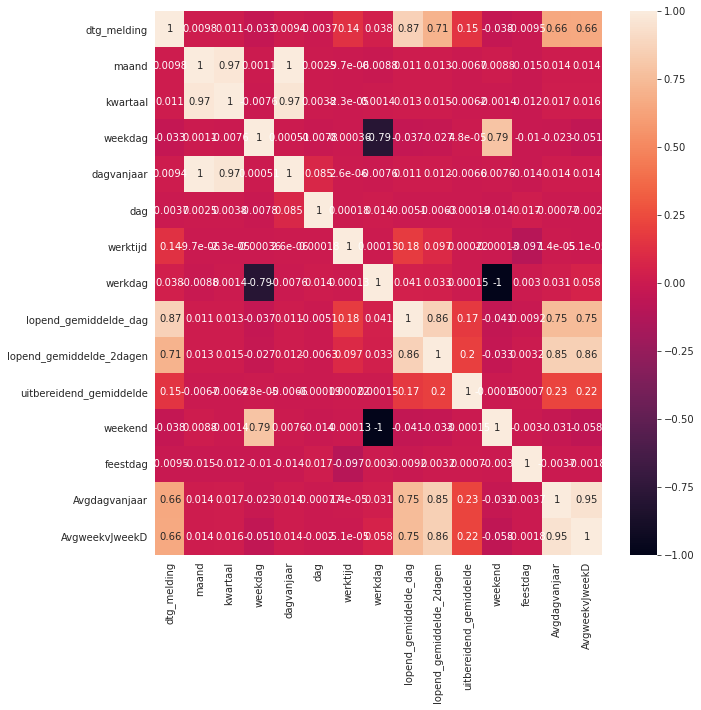

In [81]:
plt.figure(figsize=(10,10))
corr_matrix = df_mod.corr()
sns.heatmap(corr_matrix, annot=True)

In [82]:
df_mod['dtg_melding'] = df_mod['dtg_melding'] > 1
df_mod['dtg_melding'] = df_mod['dtg_melding'].astype(int)
# df_mod['dtg_melding'] = df_mod['dtg_melding'].apply(lambda x: melding_label(x))
df_mod.head(10)

,plaatscode,dtg_melding,maand,kwartaal,weekvanjaar,weekdag,dagvanjaar,dag,dagdeel,werktijd,werkdag,lopend_gemiddelde_dag,lopend_gemiddelde_2dagen,uitbereidend_gemiddelde,weekend,seizoen,feestdag,Avgdagvanjaar,AvgweekvJweekD
0,GM0482,1,5,2,20,1,135,15,nacht/ochtend,4,True,2.0,2.000000,2.000000,False,winter,False,0.727273,0.454545
1,GM0482,0,5,2,20,1,135,15,nacht/ochtend,8,True,1.0,1.000000,1.000000,False,winter,False,0.727273,0.454545
2,GM0482,0,5,2,20,1,135,15,nacht/ochtend,12,True,0.0,0.666667,0.666667,False,winter,False,0.727273,0.454545
3,GM0482,0,5,2,20,1,135,15,middag/avond,16,True,0.0,0.500000,0.500000,False,winter,False,0.727273,0.454545
4,GM0482,0,5,2,20,1,135,15,middag/avond,20,True,0.5,0.250000,0.600000,False,winter,False,0.727273,0.454545
5,GM0482,0,5,2,20,1,134,14,nacht/ochtend,0,True,0.5,0.250000,0.572802,False,winter,False,0.333333,0.454545
6,GM0482,0,5,2,20,1,134,14,nacht/ochtend,4,True,0.0,0.250000,0.572540,False,winter,False,0.333333,0.454545
7,GM0482,0,5,2,20,1,134,14,nacht/ochtend,8,True,0.5,0.500000,0.572736,False,winter,False,0.333333,0.454545
8,GM0482,0,5,2,20,1,134,14,nacht/ochtend,12,True,0.5,0.250000,0.572474,False,winter,False,0.333333,0.454545
9,GM0482,0,5,2,20,1,134,14,middag/avond,16,True,0.5,0.500000,0.572669,False,winter,False,0.333333,0.454545


<AxesSubplot:>

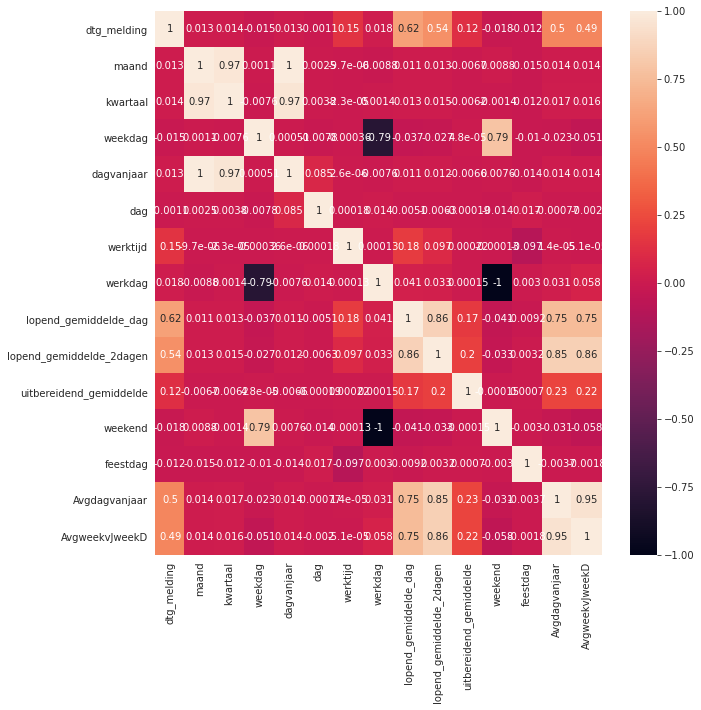

In [83]:
plt.figure(figsize=(10,10))
corr_matrix = df_mod.corr()
sns.heatmap(corr_matrix, annot=True)

0.3242442434688305
(51637, 19)
Ratio 0: 0.6757557565311695
Ratio 1: 0.3242442434688305


<AxesSubplot:title={'center':'Ratios'}, xlabel='dtg_melding', ylabel='count'>

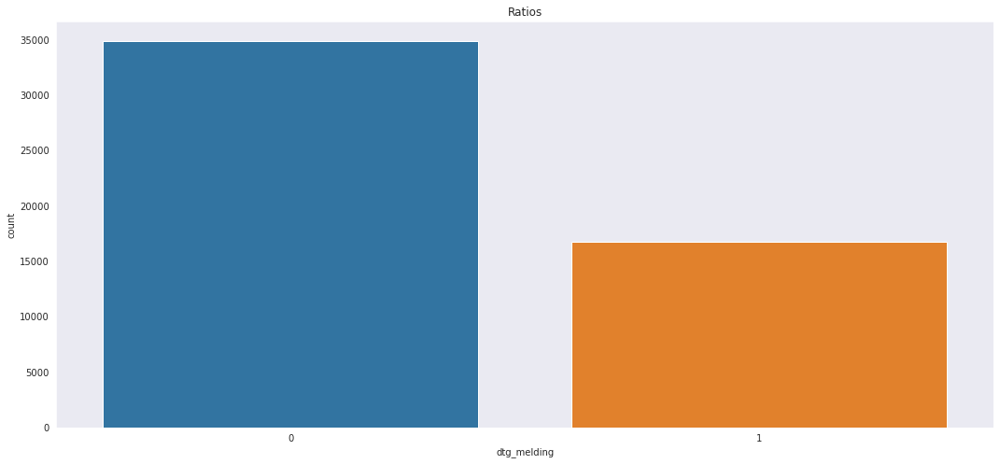

In [84]:
print(df_mod.dtg_melding.mean())
ratio_0 = df_mod.dtg_melding[df_mod.dtg_melding == 0].count()/df_mod.shape[0]
ratio_1 = df_mod.dtg_melding[df_mod.dtg_melding == 1].count()/df_mod.shape[0]
print(df_mod.shape)
print('Ratio 0: {}'.format(ratio_0))
print('Ratio 1: {}'.format(ratio_1))

plt.figure(figsize=(18,8))
plt.title('Ratios')
sns.countplot(x='dtg_melding', data=df_mod)

In [85]:
# print(df_mod.columns)
# df_mod.info()
# print(df_mod.isnull().sum())
# print(df_mod.shape)

In [86]:
print(df_mod.shape)

target = df_mod['dtg_melding']
features  = df_mod.drop(columns=['dtg_melding'])

y = target
X = features
print(X.shape, y.shape)


(51637, 19)
(51637, 18) (51637,)


In [87]:
# count examples in each class
counter = Counter(y)
# estimate scale_pos_weight value
estimate = counter[0] / counter[1]
print('Estimate: %.3f' % estimate)

Estimate: 2.084


In [88]:
print(df_mod.columns)

Index(['plaatscode', 'dtg_melding', 'maand', 'kwartaal', 'weekvanjaar',
       'weekdag', 'dagvanjaar', 'dag', 'dagdeel', 'werktijd', 'werkdag',
       'lopend_gemiddelde_dag', 'lopend_gemiddelde_2dagen',
       'uitbereidend_gemiddelde', 'weekend', 'seizoen', 'feestdag',
       'Avgdagvanjaar', 'AvgweekvJweekD'],
      dtype='object')


## GridSearch
This finds the best parameters for the model.
When finished it returns the best model

In [89]:
numeric_features = ['lopend_gemiddelde_dag', 'lopend_gemiddelde_2dagen', 'uitbereidend_gemiddelde', 'Avgdagvanjaar', 'AvgweekvJweekD']
numeric_transformer = MinMaxScaler()

categorical_features = ['plaatscode', 'maand', 'kwartaal', 'weekvanjaar', 'weekdag', 'dagvanjaar', 'dag', 'dagdeel', 'werkdag', 'weekend', 'seizoen', 'feestdag']
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])


trans_X = preprocessor.fit_transform(X)

featurenames = get_feature_names(preprocessor)
# featurenames

/home/smwhering/miniconda3/envs/datasc/lib/python3.7/site-packages/ipykernel_launcher.py:33: UserWarning:

Transformer num (type MinMaxScaler) does not provide get_feature_names. Will return input column names if available



In [90]:
X_train, X_test, y_train, y_test = train_test_split(trans_X, y, train_size=0.75, random_state=0)

In [91]:
model = xgb.XGBClassifier(objective='binary:logistic',
                          eval_metric= 'logloss',
                          scale_pos_weight=estimate,
                          early_stopping_rounds=50,
                          use_label_encoder=False,
                          n_jobs=-1,
                          verbose=2)

param_grid = {
    'classifier__gamma':[1,5,12],
    'classifier__booster':['gbtree', 'dart'],
    'classifier__learning_rate':[1, 5],
    'classifier__n_estimators':[20, 400],
    'classifier__max_depth': [3,6],
    'classifier__reg_alpha': [0, 0.8],
    'classifier__reg_lambda': [0.5, 0.6],}

grid = GridSearchCV(model, cv=2, n_jobs=-1, param_grid=param_grid, verbose=3)
grid.fit(X_train, y_train)
print("model score: %.3f" % grid.score(X_test, y_test))

Fitting 2 folds for each of 192 candidates, totalling 384 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   29.0s
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 384 out of 384 | elapsed: 11.6min finished


[16:42:07] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { classifier__booster, classifier__gamma, classifier__learning_rate, classifier__max_depth, classifier__n_estimators, classifier__reg_alpha, classifier__reg_lambda, early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


model score: 0.833


#### Best model

In [92]:
best_model = grid.estimator
# print(best_model)
best_model.fit(X_train, y_train)
pred_train = best_model.predict(X_train)
probabilities = best_model.predict_proba(X_train)

[16:42:11] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




In [93]:
print(probabilities)

[[8.1751168e-02 9.1824883e-01]
 [9.9994105e-01 5.8975194e-05]
 [9.9992502e-01 7.4970951e-05]
 ...
 [9.9999541e-01 4.5965835e-06]
 [4.9708229e-01 5.0291771e-01]
 [3.1389993e-01 6.8610007e-01]]


ROC_auc score: 0.8893054032150709


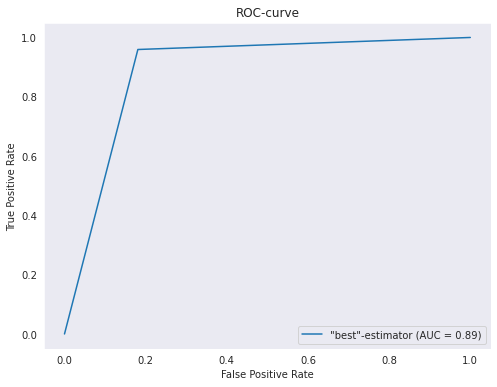

In [94]:
fpr, tpr, thresholds = roc_curve(y_train, pred_train)
roc_auc = auc(fpr, tpr)
print('ROC_auc score: {}'.format(roc_auc))
displayROC = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='"best"-estimator')


fig, ax = plt.subplots(figsize=(8, 6))
plt.title('ROC-curve')
displayROC.plot(ax=ax)  
plt.show()   

In [95]:
pred_test = grid.predict(X_test)

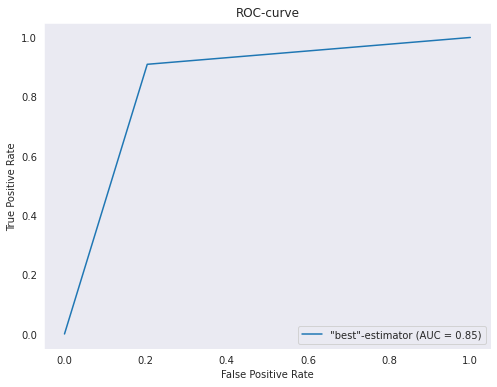

In [96]:
fpr, tpr, thresholds = roc_curve(y_test, pred_test)
roc_auc = auc(fpr, tpr)
displayROC = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='"best"-estimator')

fig, ax = plt.subplots(figsize=(8, 6))
plt.title('ROC-curve')
displayROC.plot(ax=ax)  
plt.show()   

In [97]:
print('Best model predicitons: {}'.format(pred_test))
print('Best model accuracy: {}'.format(accuracy_score(y_test, pred_test)))

Best model predicitons: [1 0 0 ... 0 0 0]
Best model accuracy: 0.8327652982184354


### Metrics Train

In [98]:
print('Classification Report:\n{}'.format(classification_report(y_train, pred_train)))
print('Precision = {}'.format(precision_score(y_train, pred_train, average='weighted')))
print('Recall = {}'.format(recall_score(y_train, pred_train, average='weighted')))
print('Accuracy = {}'.format(accuracy_score(y_train, pred_train)))
pd.crosstab(y_train, pred_train)

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.82      0.89     26161
           1       0.72      0.96      0.82     12566

    accuracy                           0.86     38727
   macro avg       0.85      0.89      0.86     38727
weighted avg       0.89      0.86      0.87     38727

Precision = 0.8928662574978905
Recall = 0.8646938828207711
Accuracy = 0.8646938828207711


col_0,0,1
dtg_melding,,
0,21431,4730
1,510,12056


<AxesSubplot:>

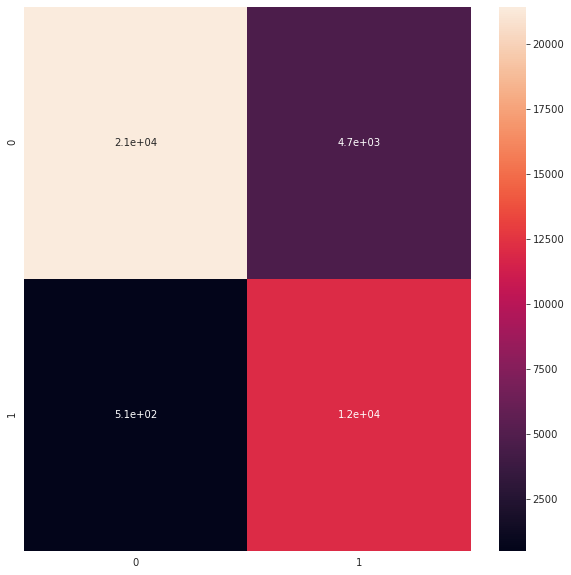

In [99]:
cm = confusion_matrix(y_train, pred_train)
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True)

### Metrics Test

In [100]:
print('Precision = {}'.format(precision_score(y_test, pred_test, average='weighted')))
print('Recall = {}'.format(recall_score(y_test, pred_test, average='weighted')))
print('Accuracy = {}'.format(accuracy_score(y_test, pred_test)))

pd.crosstab(y_test, pred_test)

Precision = 0.8618475790394975
Recall = 0.8327652982184354
Accuracy = 0.8327652982184354


col_0,0,1
dtg_melding,,
0,6952,1781
1,378,3799


<AxesSubplot:>

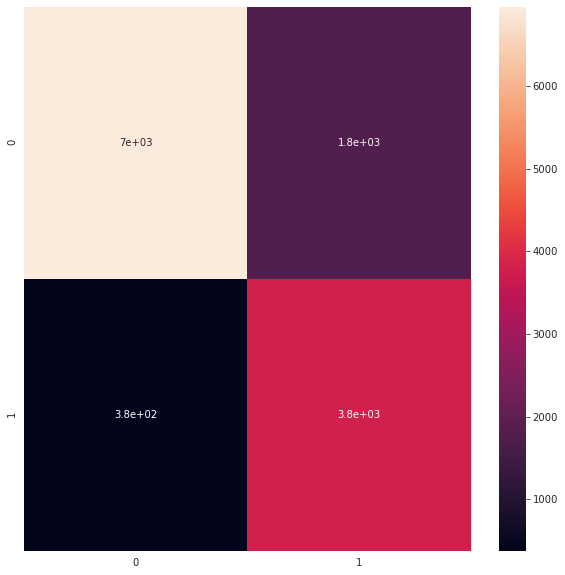

In [101]:
cm = confusion_matrix(y_test, pred_test)


plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True)

[16:42:17] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:42:17] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:42:19] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might no

<module 'matplotlib.pyplot' from '/home/smwhering/miniconda3/envs/datasc/lib/python3.7/site-packages/matplotlib/pyplot.py'>

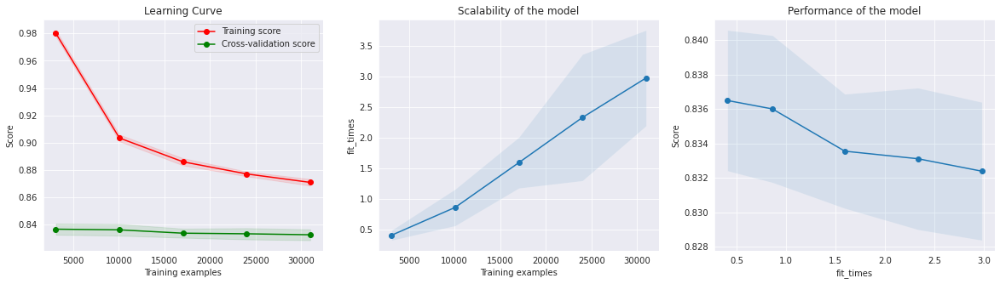

In [102]:
plot_learning_curve(best_model, 'Learning Curve', X_train, y_train)

## Reliability Graph

/home/smwhering/miniconda3/envs/datasc/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Logistic:
	Brier: 0.104
	Precision: 0.820
	Recall: 0.661
	F1: 0.732

[16:43:05] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


XGBClassifier:
	Brier: 0.105
	Precision: 0.681
	Recall: 0.910
	F1: 0.779

[16:43:08] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1607604574104/work/src/learner.cc:541: 
Parameters: { early_stopping_rounds, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:43:10] WARNING: /ho

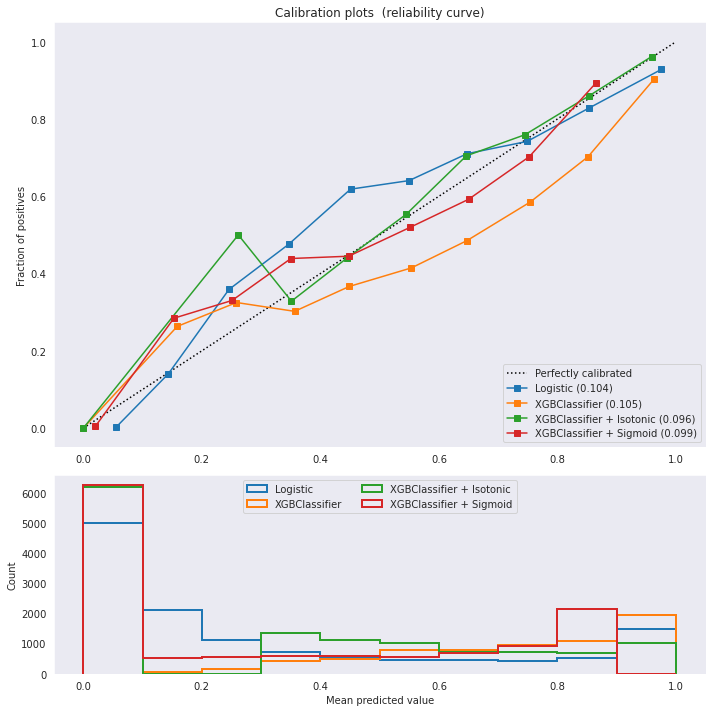

In [103]:
plot_calibration_curve(best_model, "XGBClassifier", 1)

# The Tree

In [104]:
# features can be found --> featurenames
# featurenames

In [105]:
xgb.plot_tree(best_model, rankdir='LR')
fig = plt.gcf()
fig.set_size_inches(200, 400)
fig.savefig("tree_Gemeenten", transparent=True, format='png')

array(['num__lopend_gemiddelde_dag', 'cat__x6_9', 'cat__x3_33',
       'cat__x5_11', 'cat__x1_2', 'cat__x6_6', 'cat__x6_18', 'cat__x5_8',
       'cat__x3_21', 'cat__x5_236'], dtype='<U29')

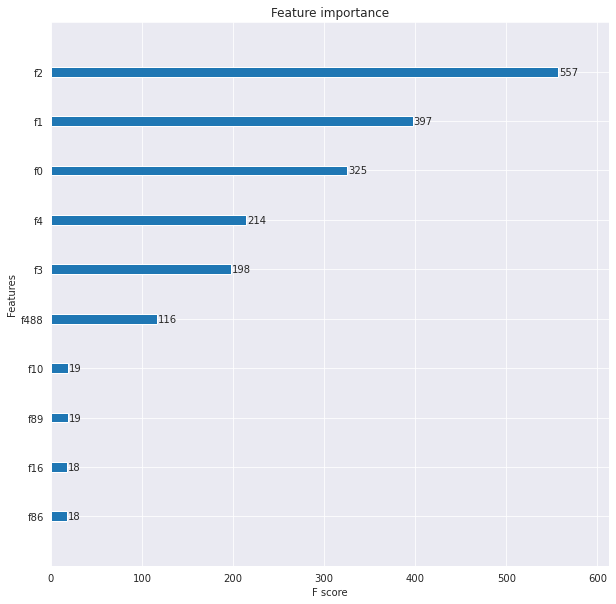

In [106]:
# sorted_idx = best_model.feature_importances_.argsort()
# plt.barh(featurenames[sorted_idx][:10], best_model.feature_importances_[sorted_idx][:10])
# plt.xlabel("Xgboost Feature Importance")


best_model.feature_names = featurenames


# display(featurenames)

xgb.plot_importance(best_model, max_num_features=10)
fig = plt.gcf()
fig.set_size_inches(10, 10)

idx = best_model.feature_importances_.argsort()[::-1][:10]
featurenames = np.array(featurenames)

featurenames[idx]
# best_model.feature_importances_